# Covid-19 Fake News Analysis

## 前処理

In [2]:
#モジュールのインポート
import pandas as pd
import matplotlib.pyplot as plt

In [38]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 5158009558576766904
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 9397665792
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 1487676210122561924
 physical_device_desc: "device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:0a:00.0, compute capability: 7.5"
 xla_global_id: 416903419,
 name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 9397665792
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 4866501858229390999
 physical_device_desc: "device: 1, name: GeForce RTX 2080 Ti, pci bus id: 0000:41:00.0, compute capability: 7.5"
 xla_global_id: 2144165316]

In [53]:
!pip install sklearn

In [61]:
!pip install -U pip --user

Note: you may need to restart the kernel to use updated packages.


In [3]:
import nltk
#nltk.download('punkt')

In [4]:
#csvファイル読み取り

#data_df = pd.read_csv(r"C:\Users\Gonken2021\Desktop\graduationresearch\covid19fakenews\CoronavirusTweets-earlyApril\2020-04-15CoronavirusTweets.CSV")

#data_df.tail()
#data_df.head()

In [4]:
genuine_data = pd.read_csv(r"C:\Users\Kurokawa\Desktop\graduationresearch\graduationresearch\Sample\genuine.csv")
fake_data = pd.read_csv(r"C:\Users\Kurokawa\Desktop\graduationresearch\graduationresearch\Sample\fake.csv")
unlabelled_data = pd.read_csv(r"C:\Users\Kurokawa\Desktop\graduationresearch\graduationresearch\Sample\unlabelled.csv")

In [6]:
genuine_data.head()

,Unnamed: 0,id,text
0,0,1255539980610555906,RT @WHO: Media briefing on #COVID19 with @DrTe...
1,1,1235249562136309761,RT @SharylAttkisson: I defer to https://t.co/2...
2,2,1259871554822955008,"""In Wuhan, 🇨🇳 the 1st cluster of #COVID19 case..."
3,3,1264183579652825088,NEW: China reported no new confirmed cases of ...
4,4,1264141525815930880,".@CDCgov, the apex health agency of USA revise..."


In [8]:
fake_data.head()

,Unnamed: 0,id,text
0,0,1224511422484238336,RT @LegendaryEnergy: Just two weeks of Coronav...
1,1,1238812169095057408,RT @OldClassicBrown: If you have ever been her...
2,2,1235071594906537985,RT @hollaa_backk: if you’ve ever used a frat h...
3,3,1224367464617861121,RT @TMe1official: Cocaine cures corona virus!!...
4,4,1274433834826608641,RT @DeplrbleRzistr: It’s almost as if a whole ...


In [9]:
print(unlabelled_data.head())
print(len(unlabelled_data))

   Unnamed: 0                   id  \
0           0  1252024214703529989   
1           1  1252024228217417729   
2           2  1252024246756311041   
3           3  1252024210572140552   
4           4  1252024208999227395   

                                                text  
0  Since the #COVID19 pandemic shutdown, the live...  
1  @readyforthenet @yutaka_IL @bhaines0 MyPOV: fr...  
2  Analysis: @willisweighsin explores what Joe Bi...  
3  41,000 Americans dead from coronavirus and Don...  
4  Orgs should have remote work as one of the str...  
5001


In [5]:
import numpy
import numpy as np

In [6]:
#textの列だけ取り出し
genuine_data = genuine_data[["text"]]
fake_data = fake_data[["text"]]
unlabelled_data = unlabelled_data[["text"]]
#print(genuine_text)
#print(fake_text)
#print(unlabelled_text)

In [7]:
#pandas.DataFrameをNumpy配列に変更
genuine_text = genuine_data.values
fake_text = fake_data.values
unlabelled_text = genuine_data.values
#print(genuine_text)
#print(fake_text)
#print(unlabelled_text)

In [8]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Kurokawa\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [9]:
from nltk.tokenize import word_tokenize

In [10]:
#pos_tag　タグをつける

import nltk
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tag import pos_tag

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Kurokawa\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Kurokawa\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [11]:
from nltk.tag import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer

def lemmatize_sentence(tokens):
    lemmatizer = WordNetLemmatizer()
    lemmatized_sentence = []
    for word, tag in pos_tag(tokens):
        if tag.startswith('NN'):
            pos = 'n'
        elif tag.startswith('VB'):
            pos = 'v'
        else:
            pos = 'a'
        lemmatized_sentence.append(lemmatizer.lemmatize(word, pos))
    return lemmatized_sentence

In [12]:
#文を正規化(レンマ化)する関数

import re, string

def remove_noise(tweet_tokens, stop_words = ()):

    cleaned_tokens = []

    for token, tag in pos_tag(tweet_tokens):
        token = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|'\
                       '(?:%[0-9a-fA-F][0-9a-fA-F]))+','', token)
        token = re.sub("(@[A-Za-z0-9_]+)","", token)
        
        ####################################################
        # RTから始まる部分を取り除く。
        token = re.sub(r'^RT[\s]+', '', token)
        # リンクを取り除く。
        token = re.sub(r'(http|https):\/\/.*[\r\n]*', '', token)
        token = re.sub(r'(http|https)', '', token)
        token = re.sub(r'\/\/.*[\r\n]*', '', token)
        # ハッシュタグを取り除く。
        token = re.sub(r'#', '', token)
        #######################################################

        if tag.startswith("NN"):
            pos = 'n'
        elif tag.startswith('VB'):
            pos = 'v'
        else:
            pos = 'a'

        lemmatizer = WordNetLemmatizer()
        token = lemmatizer.lemmatize(token, pos)

        if len(token) > 0 and token not in string.punctuation and token.lower() not in stop_words:
            cleaned_tokens.append(token.lower())
    return cleaned_tokens

In [13]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Kurokawa\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [14]:
#ストップワード除去

from nltk.corpus import stopwords
stop_words = stopwords.words('english')

#stop_words_add = {"''",'``','http','...','’','rt','“','”',"'s","n't",'--'}
stop_words_add = {"''",'``','...','’','rt','“','”',"'s","n't",'--','....','-','..'}

In [21]:
pip install emoji --upgrade

  Using cached emoji-1.6.1.tar.gz (170 kB)
  Created wheel for emoji: filename=emoji-1.6.1-py3-none-any.whl size=169314 sha256=05fb46ed19915ecb3c0752f854c994098810b4dd80e5672abed547b60bd8cdd1
  Stored in directory: c:\users\kurokawa\appdata\local\pip\cache\wheels\9d\40\e8\bd3514a8af5708171f68cfcb2259a3c22a0578d33ade04a641
Successfully built emoji
Note: you may need to restart the kernel to use updated packages.


In [15]:
#絵文字の除去
import emoji
import re

def strip_emoji(text):

    #print(emoji.emoji_count(text))

    new_text = re.sub(emoji.get_emoji_regexp(), r"", text)

    return new_text

In [16]:
emojis = '(｀ヘ´) 😀🤗⭕🤓🤔🤘🦁⭐🆗🆖🈲🤐🤗🤖🤑🆙⏩🚨🚨🚨'
print(strip_emoji(emojis))

(｀ヘ´) 


In [17]:
def get_all_words(cleaned_tokens_list):
    for tokens in cleaned_tokens_list:
        for token in tokens:
            yield token

In [18]:
from nltk import FreqDist

### 前処理したものをgenuine/fakeすべて１つのリスト(preprocessed_List)に格納

In [19]:
#全データに対して一気に前処理を行う
#genuine_textに対して一気に前処理を行う
genuine_List = []
#listlist = []
preprocessed_List = [[] for i in range(4002)]

for i in range(len(genuine_text)):
   a = strip_emoji(genuine_text[i][0]) 
   b = word_tokenize(a)
   c = lemmatize_sentence(b)
   d = remove_noise(c, stop_words)                
   e = remove_noise(d, stop_words_add)
   genuine_List.append(e)
   aaa = (' '.join(genuine_List[i])) #一回単語ごとに区切ったものをもとに戻す
   preprocessed_List[i].append(aaa)
    
   b = 1
   preprocessed_List[i].append(b)

    
print(genuine_List)
print(len(genuine_List)) #2001
print(preprocessed_List)
print(len(preprocessed_List)) #4002

[['medium', 'brief', 'covid19', 'drtedros'], ['sharylattkisson', 'defer', 'clear', 'explanation', "'ve", 'see', 'give', 'public', 'scient…'], ['wuhan', '1st', 'cluster', 'covid19', 'case', 'since', 'lockdown', 'lift', 'identify', 'also', 'report', 'increase', 'case', 'since', 'ease', 'restriction', 'fortunately', '3', 'country', 'system', 'place', 'detect', 'respond', 'resurgence', 'case', 'drtedros'], ['new', 'china', 'report', 'new', 'confirm', 'case', 'covid-19', 'across', 'country', 'saturday', 'first', 'time', 'since', 'pandemic', 'start', 'late', 'last', 'year'], ['cdcgov', 'apex', 'health', 'agency', 'usa', 'revise', 'covid-19', 'transmission', 'guideline', 'state', 'virus', 'sars-cov-2', 'transmit', 'easily', 'directly', 'come', 'contact', 'positive', 'patient', 'rather', 'touch', 'surface', 'covid19', 'coronavirusfacts'], ['get', 'late', 'update', 'covid19', 'website', 'covid19ma'], ['cpho_canada', '1/12', 'continue', 'concern', 'increase', 'number', 'covid19', 'case', 'report

In [20]:
#全データに対して一気に前処理を行う
fake_List = []

for i in range(len(fake_text)):
   a = strip_emoji(fake_text[i][0]) 
   b = word_tokenize(a)
   c = lemmatize_sentence(b)
   d = remove_noise(c, stop_words)                
   e = remove_noise(d, stop_words_add)
   fake_List.append(e)
    
   aaa = (' '.join(fake_List[i])) #一回単語ごとに区切ったものをもとに戻す
   preprocessed_List[i+2001].append(aaa)
    
   b = 0
   preprocessed_List[i+2001].append(b)


print(fake_List)
print(len(fake_List))
                
#all_pos_words = get_all_words(listlist)
#freq_dist_pos = FreqDist(all_pos_words)

[['legendaryenergy', 'two', 'week', 'coronavirus', 'medium', 'coverage', 'new', 'vaccine', 'way', 'even', 'staunch', 'libertarian', 'calli…'], ['oldclassicbrown', 'ever', 'congratulation', 'immune', 'coronavirus'], ['hollaa_backk', 'ever', 'use', 'frat', 'house', 'bathroom', 'immune', 'coronavirus'], ['tme1official', 'cocaine', 'cure', 'corona', 'virus', 'get', 'interesting', 'amma', 'become', 'dealer', 'humanity', 'sake', 'mexico', 'col…'], ['deplrblerzistr', 'almost', 'whole', 'lot', 'american', 'covid', 'immune', 'system', 'deal', 'fine', 'could', 'i…'], ['jay_piff', 'anti', 'vaccine', 'nigga', 'go', 'wish', 'vaccine', 'coronavirus', 'shit', 'start', 'rip', 'us', 'apart'], ['kittuadwani2', 'true', 'worship', 'cure', 'incurable', 'disease', 'like', 'cancer', 'aid', 'corona', 'virus', 'etc', 'saint', 'rampal', 'ji', 'maharaj', 'one', 'prov…'], ['watcherdead', 'since', 'msm', 'bash', 'people', 'discover', 'bill', 'gate', 'predict', 'corona', 'virus', 'try', 'pin', 'q', 'peopl…'], ['din

In [24]:
print(preprocessed_List)
print("-------------------------------------------------------------------------------")
print(preprocessed_List[2001])

[['medium brief covid19 drtedros', 1], ["sharylattkisson defer clear explanation 've see give public scient…", 1], ['wuhan 1st cluster covid19 case since lockdown lift identify also report increase case since ease restriction fortunately 3 country system place detect respond resurgence case drtedros', 1], ['new china report new confirm case covid-19 across country saturday first time since pandemic start late last year', 1], ['cdcgov apex health agency usa revise covid-19 transmission guideline state virus sars-cov-2 transmit easily directly come contact positive patient rather touch surface covid19 coronavirusfacts', 1], ['get late update covid19 website covid19ma', 1], ['cpho_canada 1/12 continue concern increase number covid19 case report canada province n…', 1], ['bongbongmarcos para sa mga karagdagan pang impormasyon world health organization center disease contro…', 1], ['medium brief covid19 drtedros coronavirus', 1], ['u.s. hospital deal continue influx covid-19 patient cardiol

In [26]:
unlabelled_List = []
unlabelled_preprocessed_List = []

for i in range(len(unlabelled_text)):
   a = strip_emoji(unlabelled_text[i][0]) 
   b = word_tokenize(a)
   c = lemmatize_sentence(b)
   d = remove_noise(c, stop_words)                
   e = remove_noise(d, stop_words_add)
   unlabelled_List.append(e)
    
   aaa = (' '.join(unlabelled_List[i])) #一回単語ごとに区切ったものをもとに戻す
   unlabelled_preprocessed_List.append(aaa)

print(unlabelled_List)
print(unlabelled_preprocessed_List)

[['medium', 'brief', 'covid19', 'drtedros'], ['sharylattkisson', 'defer', 'clear', 'explanation', "'ve", 'see', 'give', 'public', 'scient…'], ['wuhan', '1st', 'cluster', 'covid19', 'case', 'since', 'lockdown', 'lift', 'identify', 'also', 'report', 'increase', 'case', 'since', 'ease', 'restriction', 'fortunately', '3', 'country', 'system', 'place', 'detect', 'respond', 'resurgence', 'case', 'drtedros'], ['new', 'china', 'report', 'new', 'confirm', 'case', 'covid-19', 'across', 'country', 'saturday', 'first', 'time', 'since', 'pandemic', 'start', 'late', 'last', 'year'], ['cdcgov', 'apex', 'health', 'agency', 'usa', 'revise', 'covid-19', 'transmission', 'guideline', 'state', 'virus', 'sars-cov-2', 'transmit', 'easily', 'directly', 'come', 'contact', 'positive', 'patient', 'rather', 'touch', 'surface', 'covid19', 'coronavirusfacts'], ['get', 'late', 'update', 'covid19', 'website', 'covid19ma'], ['cpho_canada', '1/12', 'continue', 'concern', 'increase', 'number', 'covid19', 'case', 'report

In [28]:
#BoW(Bag of Words)
#genuine data
import numpy as np
#import MeCab
from sklearn.feature_extraction.text import CountVectorizer

genuine_bowlist = []

#単語のベクトル化(bow ( bag of words ))
for i in range(len(genuine_List)):
 genuine_docs = np.array(genuine_List[i])
 print(genuine_docs)
# bow ( bag of words )
 count = CountVectorizer()
 genuine_bags = count.fit_transform(genuine_docs)
 genuine_bowlist.append(genuine_bags)

 print(genuine_bags.toarray())
 #print(genuine_bags)
print(genuine_bowlist)

['medium' 'brief' 'covid19' 'drtedros']
[[0 0 0 1]
 [1 0 0 0]
 [0 1 0 0]
 [0 0 1 0]]
['sharylattkisson' 'defer' 'clear' 'explanation' "'ve" 'see' 'give'
 'public' 'scient…']
[[0 0 0 0 0 0 0 1 0]
 [0 1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 1 0 0 0]]
['wuhan' '1st' 'cluster' 'covid19' 'case' 'since' 'lockdown' 'lift'
 'identify' 'also' 'report' 'increase' 'case' 'since' 'ease' 'restriction'
 'fortunately' '3' 'country' 'system' 'place' 'detect' 'respond'
 'resurgence' 'case' 'drtedros']
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
 [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0

In [31]:
#BoW(Bag of Words)
#fake data
import numpy as np
#import MeCab
from sklearn.feature_extraction.text import CountVectorizer

fake_bowlist = []

#単語のベクトル化(bow ( bag of words ))
for i in range(len(fake_List)):
 fake_docs = np.array(fake_List[i])
 print(fake_docs)
# bow ( bag of words )
 count = CountVectorizer()
 fake_bags = count.fit_transform(fake_docs)
 fake_bowlist.append(fake_bags)

 print(fake_bags.toarray())

['legendaryenergy' 'two' 'week' 'coronavirus' 'medium' 'coverage' 'new'
 'vaccine' 'way' 'even' 'staunch' 'libertarian' 'calli…']
[[0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0]]
['oldclassicbrown' 'ever' 'congratulation' 'immune' 'coronavirus']
[[0 0 0 0 1]
 [0 0 1 0 0]
 [1 0 0 0 0]
 [0 0 0 1 0]
 [0 1 0 0 0]]
['hollaa_backk' 'ever' 'use' 'frat' 'house' 'bathroom' 'immune'
 'coronavirus']
[[0 0 0 0 1 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1]
 [0 0 0 1 0 0 0 0]
 [0 0 0 0 0 1 0 0]
 [1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0]
 [0 1 0 0 0 0 0 0]]
['tme1official' 'cocaine' 'cure' 'corona' 'virus' 'get' 'interesting'
 'amma' 'become' 'dealer' 'humanity' 'sake' 'mexico' 'co

In [32]:
#BoW(Bag of Words)
#unlabelled data
import numpy as np
#import MeCab
from sklearn.feature_extraction.text import CountVectorizer

unlabelled_bowlist = []

#単語のベクトル化(bow ( bag of words ))
for i in range(len(unlabelled_List)):
 unlabelled_docs = np.array(unlabelled_List[i])
 print(unlabelled_docs)
# bow ( bag of words )
 count = CountVectorizer()
 unlabelled_bags = count.fit_transform(unlabelled_docs)
 unlabelled_bowlist.append(unlabelled_bags)

 print(unlabelled_bags.toarray())

NameError: name 'unlabelled_List' is not defined

In [33]:
import numpy as np

from sklearn.feature_extraction.text import TfidfTransformer

In [33]:
# tf-idf
#genuine data
for i in range(len(genuine_bowlist)):
 tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)
 np.set_printoptions(precision=2)
 genuine_tf_idf = tfidf.fit_transform(genuine_bowlist[i])
 #tf_idf = tfidf.fit_transform(bags)
 print(i)
 print(genuine_tf_idf.toarray())

0
[[0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]]
1
[[0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0.]]
2
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [34]:
# tf-idf
#fake data
for i in range(len(fake_bowlist)):
 tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)
 np.set_printoptions(precision=2)
 fake_tf_idf = tfidf.fit_transform(fake_bowlist[i])
 #tf_idf = tfidf.fit_transform(bags)
 print(fake_tf_idf.toarray())

[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]]
[[0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [35]:
# tf-idf
#unlabelled data
for i in range(len(unlabelled_bowlist)):
 tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)
 np.set_printoptions(precision=2)
 unlabelled_tf_idf = tfidf.fit_transform(unlabelled_bowlist[i])
 #tf_idf = tfidf.fit_transform(bags)
 print(unlabelled_tf_idf.toarray())

[[0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]]
[[0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0.]]
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [52]:
import nltk
print(nltk.__version__)

3.6


### 感情分析(TextBlob/VADER)したものでリストを作成

In [25]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Kurokawa\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [26]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [27]:
vader_analyzer = SentimentIntensityAnalyzer()

In [33]:
pip install TextBlob

  Using cached textblob-0.17.1-py2.py3-none-any.whl (636 kB)
Note: you may need to restart the kernel to use updated packages.


In [28]:
from textblob import TextBlob

In [29]:
#前処理後
preprocessed_text = [row[0] for row in preprocessed_List]

a=1
b=0

preprocessed_polarity = [[] for i in range(4002)]
preprocessed_subjectivity = [[] for i in range(4002)]

for i in range(2001):
  analysis = TextBlob(preprocessed_text[i])
  print(analysis.sentiment)
  preprocessed_polarity[i].append(analysis.sentiment.polarity)
  preprocessed_polarity[i].append(a)
  preprocessed_subjectivity[i].append(analysis.sentiment.polarity)
  preprocessed_subjectivity[i].append(a)

for i in range(2001):
  #genuine_List_= (' '.join(genuine_List[i]))
  analysis = TextBlob(preprocessed_text[i+2001])
  print(analysis.sentiment)
  preprocessed_polarity[i+2001].append(analysis.sentiment.polarity)
  preprocessed_polarity[i+2001].append(b)
  preprocessed_subjectivity[i+2001].append(analysis.sentiment.polarity)
  preprocessed_subjectivity[i+2001].append(b)

print(preprocessed_polarity)

Sentiment(polarity=0.0, subjectivity=0.3333333333333333)
Sentiment(polarity=0.05000000000000001, subjectivity=0.22499999999999998)
Sentiment(polarity=0.4, subjectivity=0.7)
Sentiment(polarity=0.04454545454545454, subjectivity=0.3818181818181818)
Sentiment(polarity=0.16363636363636364, subjectivity=0.4727272727272727)
Sentiment(polarity=-0.3, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.1, subjectivity=0.1)
Sentiment(polarity=0.0, subjectivity=0.3333333333333333)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.13636363636363635, subjectivity=0.5)
Sentiment(polarity=0.06818181818181818, subjectivity=0.22727272727272727)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.30833333333333335, subjectivity=0.6583333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0, subjectivity=0.0)
Senti

In [30]:
#VADERで感情分析
preprocessed_text = [row[0] for row in preprocessed_List]

a=1
b=0

preprocessed_compound = [[] for i in range(4002)]

for i in range(2001):
  aaa = vader_analyzer.polarity_scores(preprocessed_text[i])
  compound_analysis = aaa['compound']
  preprocessed_compound[i].append(compound_analysis)
  preprocessed_compound[i].append(a)
  
for i in range(2001):
  aaa = vader_analyzer.polarity_scores(preprocessed_text[i+2001])
  compound_analysis = aaa['compound']
  preprocessed_compound[i+2001].append(compound_analysis)
  preprocessed_compound[i+2001].append(b)

print(preprocessed_compound)

[[0.0, 1], [0.1027, 1], [0.4019, 1], [0.0, 1], [0.7184, 1], [0.0, 1], [0.3818, 1], [0.0, 1], [0.0, 1], [-0.8807, 1], [0.0, 1], [0.0, 1], [0.3818, 1], [-0.3818, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0258, 1], [0.7096, 1], [-0.6369, 1], [-0.4767, 1], [0.3182, 1], [0.5267, 1], [0.4019, 1], [0.6124, 1], [0.8176, 1], [-0.34, 1], [-0.7783, 1], [0.891, 1], [0.0772, 1], [-0.4019, 1], [-0.3818, 1], [-0.5574, 1], [0.0, 1], [0.8979, 1], [-0.296, 1], [0.296, 1], [0.3182, 1], [0.0, 1], [0.4019, 1], [0.1027, 1], [0.0, 1], [0.5574, 1], [0.0, 1], [0.8779, 1], [0.4588, 1], [0.0, 1], [0.5574, 1], [0.0, 1], [0.0, 1], [-0.7351, 1], [0.4404, 1], [0.3818, 1], [0.3818, 1], [-0.7003, 1], [0.34, 1], [0.7906, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [-0.2732, 1], [-0.6369, 1], [-0.0258, 1], [0.3182, 1], [0.3182, 1], [0.0772, 1], [0.34, 1], [0.4019, 1], [0.765, 1], [-0.5994, 1], [0.4215, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.6597, 1], [0.7506, 1], [0.128, 1], [0.4939, 1], [-0.8689,

### 1/10 絵文字を処理しないで感情分析---------------------------

In [41]:
#全データに対して一気に前処理を行う
#genuine_textに対して一気に前処理を行う
emoji_genuine_List = []
#listlist = []
emoji_preprocessed_List = [[] for i in range(4002)]

for i in range(len(genuine_text)):
  # a = strip_emoji(genuine_text[i][0]) 
   b = word_tokenize(genuine_text[i][0])
   c = lemmatize_sentence(b)
   d = remove_noise(c, stop_words)                
   e = remove_noise(d, stop_words_add)
   emoji_genuine_List.append(e)
   aaa = (' '.join(emoji_genuine_List[i])) #一回単語ごとに区切ったものをもとに戻す
   emoji_preprocessed_List[i].append(aaa)
    
   b = 1
   emoji_preprocessed_List[i].append(b)


emoji_fake_List = []

for i in range(len(fake_text)):
   #a = strip_emoji(fake_text[i][0]) 
   b = word_tokenize(fake_text[i][0])
   c = lemmatize_sentence(b)
   d = remove_noise(c, stop_words)                
   e = remove_noise(d, stop_words_add)
   emoji_fake_List.append(e)
    
   aaa = (' '.join(emoji_fake_List[i])) #一回単語ごとに区切ったものをもとに戻す
   emoji_preprocessed_List[i+2001].append(aaa)
    
   b = 0
   emoji_preprocessed_List[i+2001].append(b)


print(emoji_preprocessed_List)

[['medium brief covid19 drtedros', 1], ["sharylattkisson defer clear explanation 've see give public scient…", 1], ['wuhan 🇨🇳 1st cluster covid19 case since lockdown lift identify 🇩🇪 also report increase case since ease restriction fortunately 3 country system place detect respond resurgence case drtedros', 1], ['new china report new confirm case covid-19 across country saturday first time since pandemic start late last year', 1], ['cdcgov apex health agency usa revise covid-19 transmission guideline state virus sars-cov-2 transmit easily directly come contact positive patient rather touch surface covid19 coronavirusfacts', 1], ['get late update covid19 website covid19ma', 1], ['cpho_canada 1/12 continue concern increase number covid19 case report canada province n…', 1], ['bongbongmarcos para sa mga karagdagan pang impormasyon world health organization center disease contro…', 1], ['medium brief covid19 drtedros coronavirus', 1], ['u.s. hospital deal continue influx covid-19 patient c

In [42]:
#前処理後
emoji_preprocessed_text = [row[0] for row in emoji_preprocessed_List]

a=1
b=0

emoji_preprocessed_polarity = [[] for i in range(4002)]
emoji_preprocessed_subjectivity = [[] for i in range(4002)]

for i in range(2001):
  analysis = TextBlob(emoji_preprocessed_text[i])
  print(analysis.sentiment)
  emoji_preprocessed_polarity[i].append(analysis.sentiment.polarity)
  emoji_preprocessed_polarity[i].append(a)
  emoji_preprocessed_subjectivity[i].append(analysis.sentiment.polarity)
  emoji_preprocessed_subjectivity[i].append(a)

for i in range(2001):
  #genuine_List_= (' '.join(genuine_List[i]))
  analysis = TextBlob(preprocessed_text[i+2001])
  print(analysis.sentiment)
  emoji_preprocessed_polarity[i+2001].append(analysis.sentiment.polarity)
  emoji_preprocessed_polarity[i+2001].append(b)
  emoji_preprocessed_subjectivity[i+2001].append(analysis.sentiment.polarity)
  emoji_preprocessed_subjectivity[i+2001].append(b)

print(emoji_preprocessed_polarity)

Sentiment(polarity=0.0, subjectivity=0.3333333333333333)
Sentiment(polarity=0.05000000000000001, subjectivity=0.22499999999999998)
Sentiment(polarity=0.4, subjectivity=0.7)
Sentiment(polarity=0.04454545454545454, subjectivity=0.3818181818181818)
Sentiment(polarity=0.16363636363636364, subjectivity=0.4727272727272727)
Sentiment(polarity=-0.3, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.1, subjectivity=0.1)
Sentiment(polarity=0.0, subjectivity=0.3333333333333333)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.13636363636363635, subjectivity=0.5)
Sentiment(polarity=0.06818181818181818, subjectivity=0.22727272727272727)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.30833333333333335, subjectivity=0.6583333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0, subjectivity=0.0)
Senti

In [43]:
#VADERで感情分析
emoji_preprocessed_text = [row[0] for row in emoji_preprocessed_List]

a=1
b=0

emoji_preprocessed_compound = [[] for i in range(4002)]

for i in range(2001):
  aaa = vader_analyzer.polarity_scores(emoji_preprocessed_text[i])
  compound_analysis = aaa['compound']
  emoji_preprocessed_compound[i].append(compound_analysis)
  emoji_preprocessed_compound[i].append(a)
  
for i in range(2001):
  aaa = vader_analyzer.polarity_scores(preprocessed_text[i+2001])
  compound_analysis = aaa['compound']
  emoji_preprocessed_compound[i+2001].append(compound_analysis)
  emoji_preprocessed_compound[i+2001].append(b)

print(emoji_preprocessed_compound)

[[0.0, 1], [0.1027, 1], [0.4019, 1], [0.0, 1], [0.7184, 1], [0.0, 1], [0.3818, 1], [0.0, 1], [0.0, 1], [-0.8807, 1], [0.0, 1], [0.0, 1], [0.3818, 1], [-0.3818, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0258, 1], [0.7096, 1], [-0.6369, 1], [-0.4767, 1], [0.3182, 1], [0.5267, 1], [0.4019, 1], [0.6124, 1], [0.8176, 1], [-0.34, 1], [-0.7783, 1], [0.891, 1], [0.0772, 1], [-0.4019, 1], [-0.3818, 1], [-0.5574, 1], [0.0, 1], [0.8979, 1], [-0.5859, 1], [0.296, 1], [0.3182, 1], [0.0, 1], [0.4019, 1], [0.1027, 1], [0.0, 1], [0.5574, 1], [0.0, 1], [0.8779, 1], [0.4588, 1], [0.0, 1], [0.5574, 1], [0.0, 1], [0.0, 1], [-0.7351, 1], [0.4404, 1], [0.3818, 1], [0.3818, 1], [-0.7003, 1], [0.34, 1], [0.7906, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.0, 1], [-0.2732, 1], [-0.6369, 1], [-0.0258, 1], [0.3182, 1], [0.3182, 1], [0.0772, 1], [0.34, 1], [0.4019, 1], [0.765, 1], [-0.5994, 1], [0.4215, 1], [0.0, 1], [0.0, 1], [0.0, 1], [0.6597, 1], [0.7506, 1], [0.128, 1], [0.4939, 1], [-0.8689

### --------------------------------------------------------------------------

### Bag of wordsで教師あり学習

In [21]:
df = pd.DataFrame(preprocessed_List)
df.head()

,0,1
0,medium brief covid19 drtedros,1
1,sharylattkisson defer clear explanation 've se...,1
2,wuhan 1st cluster covid19 case since lockdown ...,1
3,new china report new confirm case covid-19 acr...,1
4,cdcgov apex health agency usa revise covid-19 ...,1


In [35]:
#Bag of Wordsで分析
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(max_features = 2)
X=cv.fit_transform(df.iloc[:,0]).toarray()
print(X)
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df.iloc[:,1].values
print(y)
#y=dataset

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

[[0 1]
 [0 0]
 [0 1]
 ...
 [1 0]
 [1 0]
 [0 0]]
[1 1 1 ... 0 0 0]


In [36]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
model =RandomForestClassifier(n_estimators =400,criterion="entropy",random_state =0)
model.fit(X_train,y_train)
# Predicting the Test set results
y_pred = model.predict(X_test)

In [37]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)

[[576  24]
 [264 337]]


In [38]:
from sklearn.metrics import accuracy_score
print('Accuracy:',accuracy_score(y_test,y_pred))

Accuracy: 0.7601998334721066


In [39]:
from sklearn.metrics import f1_score
print('F1 score:', f1_score(y_test,y_pred))

F1 score: 0.7006237006237006


In [40]:
from sklearn.metrics import precision_score
print('Precision:', precision_score(y_test,y_pred))

Precision: 0.9335180055401662


In [41]:
from sklearn.metrics import recall_score
print('Recall:', recall_score(y_test,y_pred))

Recall: 0.5607321131447587


In [42]:
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('True Negative Rate:',TNR)

True Negative Rate: 0.96


In [234]:
#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.feature_extraction.text import CountVectorizer

cv=CountVectorizer(max_features = 2)
X= cv.fit_transform(df.iloc[:,0]).toarray()
y = df.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
model.fit(X_train, y_train)

score = model.score(X_test, y_test)

print('score is', score)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

score is 0.7601998334721066
[[576  24]
 [264 337]]
-----------------------------------------
Accuracy: 0.7601998334721066
-----------------------------------------
F1 score: 0.7006237006237006
-----------------------------------------
Precision: 0.9335180055401662
-----------------------------------------
Recall: 0.5607321131447587
-----------------------------------------
True Negative Rate: 0.96


In [235]:
#SVC
from sklearn.svm import SVC

cv=CountVectorizer(max_features = 2)
X= cv.fit_transform(df.iloc[:,0]).toarray()
y = df.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = SVC(gamma='auto')
model.fit(X_train, y_train)

score = model.score(X_test, y_test)

print('score is', score)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

score is 0.7601998334721066
[[576  24]
 [264 337]]
-----------------------------------------
Accuracy: 0.7601998334721066
-----------------------------------------
F1 score: 0.7006237006237006
-----------------------------------------
Precision: 0.9335180055401662
-----------------------------------------
Recall: 0.5607321131447587
-----------------------------------------
True Negative Rate: 0.96


In [291]:
#kNN
from sklearn.neighbors import KNeighborsClassifier

cv=CountVectorizer(max_features = 2)
X= cv.fit_transform(df.iloc[:,0]).toarray()
y = df.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train, y_train)

score = model.score(X_test, y_test)

print('score is', score)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

score is 0.7102414654454621
[[313 287]
 [ 61 540]]
-----------------------------------------
Accuracy: 0.7102414654454621
-----------------------------------------
F1 score: 0.7563025210084033
-----------------------------------------
Precision: 0.652962515114873
-----------------------------------------
Recall: 0.8985024958402662
-----------------------------------------
True Negative Rate: 0.5216666666666666


In [37]:
pip install tensorflow

  Using cached termcolor-1.1.0.tar.gz (3.9 kB)
  Using cached tensorflow_estimator-2.7.0-py2.py3-none-any.whl (463 kB)
  Using cached tensorboard-2.7.0-py3-none-any.whl (5.8 MB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
  Using cached flatbuffers-2.0-py2.py3-none-any.whl (26 kB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached keras-2.7.0-py2.py3-none-any.whl (1.3 MB)
  Using cached Markdown-3.3.6-py3-none-any.whl (97 kB)
  Using cached tensorboard_data_server-0.6.1-py3-none-any.whl (2.4 kB)
  Using cached google_auth-2.3.3-py2.py3-none-any.whl (155 kB)
  Using cached google_auth_oauthlib-0.4.6-py2.py3-none-any.whl (18 kB)
  Using cached cachetools-4.2.4-py3-none-any.whl (10 kB)
  Using cached pyasn1_modules-0.2.8-py2.py3-none-any.whl (155 kB)
  Using cached rsa-4.8-

In [1]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import utils

# データの読み込み
cv=CountVectorizer(max_features = 2)
X= cv.fit_transform(df.iloc[:,0]).toarray()
y = utils.to_categorical(df.iloc[:,1].values)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = models.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train)

crossentropy, acc = model.evaluate(X_test, y_test)

print('Categorical Crossentropy is', crossentropy)
print('Accuracy is', acc)

AlreadyExistsError: Another metric with the same name already exists.

In [56]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [71]:
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

# データの読み込み
cv=CountVectorizer(max_features = 2)
X= cv.fit_transform(df.iloc[:,0]).toarray()
y = df.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

score = accuracy_score(y_test, y_pred)

print('score is', score)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7
[LightGBM] [Info] Number of data points in the train set: 2801, number of used features: 2
[LightGBM] [Info] Start training from score -0.692790
[LightGBM] [Info] Start training from score -0.693504
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's multi_logloss: 0.645428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's multi_logloss: 0.60926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

### Tf-idfで教師あり学習

In [21]:
#TF-idfで分析
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

#from sklearn.model_selection import train_test_split
3#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

3

In [37]:
print(X_test)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [38]:
print(y_test)

[0 1 0 ... 1 0 0]


In [23]:
#各種インポート
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [119]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
model =RandomForestClassifier(n_estimators =400,criterion="entropy",random_state =0)
model.fit(X_train,y_train)
# Predicting the Test set results
y_pred = model.predict(X_test)

print(y_pred)

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[0 0 0 ... 1 0 0]
[[581  19]
 [ 20 581]]
-----------------------------------------
Accuracy: 0.9675270607826811
-----------------------------------------
F1 score: 0.9675270607826811
-----------------------------------------
Precision: 0.9683333333333334
-----------------------------------------
Recall: 0.9667221297836939
-----------------------------------------
True Negative Rate: 0.9683333333333334


In [49]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
model =RandomForestClassifier(n_estimators =4388,criterion="entropy",random_state =0)
model.fit(X_train,y_train)
# Predicting the Test set results
y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[582  18]
 [ 19 582]]
-----------------------------------------
Accuracy: 0.9691923397169026
-----------------------------------------
F1 score: 0.9691923397169026
-----------------------------------------
Precision: 0.97
-----------------------------------------
Recall: 0.9683860232945092
-----------------------------------------
True Negative Rate: 0.97


In [50]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
model =RandomForestClassifier(n_estimators =4000,criterion="entropy",random_state =0)
model.fit(X_train,y_train)
# Predicting the Test set results
y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[581  19]
 [ 19 582]]
-----------------------------------------
Accuracy: 0.9683597002497918
-----------------------------------------
F1 score: 0.9683860232945092
-----------------------------------------
Precision: 0.9683860232945092
-----------------------------------------
Recall: 0.9683860232945092
-----------------------------------------
True Negative Rate: 0.9683333333333334


In [104]:
#RandomForest
#test_size = 0.20/n_estimators =4821
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.ensemble import RandomForestClassifier
model =RandomForestClassifier(n_estimators =4821,criterion="entropy",random_state =0)
model.fit(X_train,y_train)
# Predicting the Test set results
y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[383  10]
 [  9 399]]
-----------------------------------------
Accuracy: 0.9762796504369539
-----------------------------------------
F1 score: 0.9767441860465117
-----------------------------------------
Precision: 0.9755501222493888
-----------------------------------------
Recall: 0.9779411764705882
-----------------------------------------
True Negative Rate: 0.9745547073791349


In [48]:
#パラメーターチューニング
#test_size=0.30

import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


# データの準備、および分割
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  4000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  4388
通常のランダムフォレストモデルによる予測値         :  0.847
グリッドサーチ・ランダムフォレストモデルによる予測値   :  0.873
ランダムサーチ・ランダムフォレストモデルによる予測値  :  0.873


In [103]:
#パラメーターチューニング
#test_size=0.20

import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


# データの準備、および分割
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  1000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  4821
通常のランダムフォレストモデルによる予測値         :  0.855
グリッドサーチ・ランダムフォレストモデルによる予測値   :  0.880
ランダムサーチ・ランダムフォレストモデルによる予測値  :  0.890


In [100]:
#SVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[589  11]
 [ 27 574]]
-----------------------------------------
Accuracy: 0.9683597002497918
-----------------------------------------
F1 score: 0.9679595278246205
-----------------------------------------
Precision: 0.9811965811965812
-----------------------------------------
Recall: 0.9550748752079867
-----------------------------------------
True Negative Rate: 0.9816666666666667


In [115]:
#SVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[583  17]
 [ 25 576]]
-----------------------------------------
Accuracy: 0.9650291423813488
-----------------------------------------
F1 score: 0.9648241206030151
-----------------------------------------
Precision: 0.9713322091062394
-----------------------------------------
Recall: 0.9584026622296173
-----------------------------------------
True Negative Rate: 0.9716666666666667


In [116]:
#SVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[589  11]
 [ 27 574]]
-----------------------------------------
Accuracy: 0.9683597002497918
-----------------------------------------
F1 score: 0.9679595278246205
-----------------------------------------
Precision: 0.9811965811965812
-----------------------------------------
Recall: 0.9550748752079867
-----------------------------------------
True Negative Rate: 0.9816666666666667


In [101]:
#SVC
#test_size=0.20
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[387   6]
 [ 16 392]]
-----------------------------------------
Accuracy: 0.9725343320848939
-----------------------------------------
F1 score: 0.9727047146401986
-----------------------------------------
Precision: 0.9849246231155779
-----------------------------------------
Recall: 0.9607843137254902
-----------------------------------------
True Negative Rate: 0.9847328244274809


In [346]:
#SVC
#test_size=0.20
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = OneVsOneClassifier(LinearSVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[385   8]
 [ 15 393]]
-----------------------------------------
Accuracy: 0.9712858926342073
-----------------------------------------
F1 score: 0.9715698393077874
-----------------------------------------
Precision: 0.9800498753117207
-----------------------------------------
Recall: 0.9632352941176471
-----------------------------------------
True Negative Rate: 0.9796437659033079


In [348]:
#SVC
#test_size=0.20
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = OneVsRestClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[387   6]
 [ 16 392]]
-----------------------------------------
Accuracy: 0.9725343320848939
-----------------------------------------
F1 score: 0.9727047146401986
-----------------------------------------
Precision: 0.9849246231155779
-----------------------------------------
Recall: 0.9607843137254902
-----------------------------------------
True Negative Rate: 0.9847328244274809


In [349]:
#SVC
#test_size=0.20
#model = SVC(gamma='auto')
model = OneVsRestClassifier(LinearSVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[385   8]
 [ 15 393]]
-----------------------------------------
Accuracy: 0.9712858926342073
-----------------------------------------
F1 score: 0.9715698393077874
-----------------------------------------
Precision: 0.9800498753117207
-----------------------------------------
Recall: 0.9632352941176471
-----------------------------------------
True Negative Rate: 0.9796437659033079


In [114]:
#SVC
#test_size=0.20
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)
from sklearn.svm import SVC

from sklearn.svm import LinearSVC
#model = SVC(gamma='auto')
model = LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[385   8]
 [ 15 393]]
-----------------------------------------
Accuracy: 0.9712858926342073
-----------------------------------------
F1 score: 0.9715698393077874
-----------------------------------------
Precision: 0.9800498753117207
-----------------------------------------
Recall: 0.9632352941176471
-----------------------------------------
True Negative Rate: 0.9796437659033079


In [347]:
#SVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier
""""
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)"""
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[387   6]
 [ 16 392]]
-----------------------------------------
Accuracy: 0.9725343320848939
-----------------------------------------
F1 score: 0.9727047146401986
-----------------------------------------
Precision: 0.9849246231155779
-----------------------------------------
Recall: 0.9607843137254902
-----------------------------------------
True Negative Rate: 0.9847328244274809


In [ ]:
import scipy.stats
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

#乳癌データの読み込み
#cancer_data = load_breast_cancer()

#条件設定
max_score = 0
SearchMethod = 0
SVC_grid = {SVC(): {"C": [10 ** i for i in range(-5, 6)],
                    "kernel": ["linear", "rbf", "sigmoid"],
                    "decision_function_shape": ["ovo", "ovr"],
                    "random_state": [i for i in range(0, 101)]
                   }}
SVC_random = {SVC(): {"C": scipy.stats.uniform(0.00001, 1000),
                    "kernel": ["linear", "rbf", "sigmoid"],
                    "decision_function_shape": ["ovo", "ovr"],
                    "random_state": scipy.stats.randint(0, 100)
                     }}

#トレーニングデータ、テストデータの分離
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

#グリッドサーチ
for model, param in SVC_grid.items():
    clf = GridSearchCV(model, param)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    score = f1_score(y_test, y_pred, average="micro")

    if max_score < score:
        max_score = score
        best_param = clf.best_params_
        best_model = model.__class__.__name__

#ランダムサーチ
for model, param in SVC_random.items():
    clf =RandomizedSearchCV(model, param)
    clf.fit(X_train, y_train)
    pred_y = clf.predict(X_test)
    score = f1_score(y_test, y_pred, average="micro")

    if max_score < score:
        SearchMethod = 1
        max_score = score
        best_param = clf.best_params_
        best_model = model.__class__.__name__

if SearchMethod == 0:
    print("サーチ方法:グリッドサーチ")
else:
    print("サーチ方法:ランダムサーチ")
print("ベストスコア:{}".format(max_score))
print("モデル:{}".format(best_model))
print("パラメーター:{}".format(best_param))

#ハイパーパラメータを調整しない場合との比較
model = SVC()
model.fit(X_train, y_train)
score = model.score(X_train, y_train)
print("")
print("デフォルトスコア:", score)

In [133]:
#ロジスティック回帰 #test_size=0.30
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[578  22]
 [ 30 571]]
-----------------------------------------
Accuracy: 0.9567027477102414
-----------------------------------------
F1 score: 0.9564489112227806
-----------------------------------------
Precision: 0.9629005059021922
-----------------------------------------
Recall: 0.9500831946755408
-----------------------------------------
True Negative Rate: 0.9633333333333334


In [24]:
#ロジスティック回帰 #test_size=0.20
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[380  13]
 [ 19 389]]
-----------------------------------------
Accuracy: 0.9600499375780275
-----------------------------------------
F1 score: 0.9604938271604939
-----------------------------------------
Precision: 0.9676616915422885
-----------------------------------------
Recall: 0.9534313725490197
-----------------------------------------
True Negative Rate: 0.9669211195928753


In [240]:
#kNN　#test_size=0.30
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[520  80]
 [ 60 541]]
-----------------------------------------
Accuracy: 0.8834304746044963
-----------------------------------------
F1 score: 0.8854337152209493
-----------------------------------------
Precision: 0.8711755233494364
-----------------------------------------
Recall: 0.9001663893510815
-----------------------------------------
True Negative Rate: 0.8666666666666667


In [25]:
#kNN　#test_size=0.20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[341  52]
 [ 30 378]]
-----------------------------------------
Accuracy: 0.8976279650436954
-----------------------------------------
F1 score: 0.902147971360382
-----------------------------------------
Precision: 0.8790697674418605
-----------------------------------------
Recall: 0.9264705882352942
-----------------------------------------
True Negative Rate: 0.8676844783715013


In [22]:
#kNN　#test_size=0.20　#n_neighbors=5
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[342  51]
 [ 25 383]]
-----------------------------------------
Accuracy: 0.9051186017478152
-----------------------------------------
F1 score: 0.9097387173396675
-----------------------------------------
Precision: 0.8824884792626728
-----------------------------------------
Recall: 0.9387254901960784
-----------------------------------------
True Negative Rate: 0.8702290076335878


In [23]:
#kNN　#test_size=0.20　#n_neighbors=10
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=10)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[363  30]
 [ 38 370]]
-----------------------------------------
Accuracy: 0.9151061173533084
-----------------------------------------
F1 score: 0.9158415841584158
-----------------------------------------
Precision: 0.925
-----------------------------------------
Recall: 0.9068627450980392
-----------------------------------------
True Negative Rate: 0.9236641221374046


In [24]:
#kNN　#test_size=0.20　#n_neighbors=20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=20)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[356  37]
 [ 30 378]]
-----------------------------------------
Accuracy: 0.916354556803995
-----------------------------------------
F1 score: 0.9185905224787364
-----------------------------------------
Precision: 0.9108433734939759
-----------------------------------------
Recall: 0.9264705882352942
-----------------------------------------
True Negative Rate: 0.905852417302799


In [25]:
#kNN　#test_size=0.20　#n_neighbors=30
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=30)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[354  39]
 [ 26 382]]
-----------------------------------------
Accuracy: 0.9188514357053683
-----------------------------------------
F1 score: 0.9215922798552473
-----------------------------------------
Precision: 0.9073634204275535
-----------------------------------------
Recall: 0.9362745098039216
-----------------------------------------
True Negative Rate: 0.9007633587786259


In [26]:
#kNN　#test_size=0.20　#n_neighbors=100
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=100)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[355  38]
 [ 22 386]]
-----------------------------------------
Accuracy: 0.9250936329588015
-----------------------------------------
F1 score: 0.9278846153846154
-----------------------------------------
Precision: 0.910377358490566
-----------------------------------------
Recall: 0.946078431372549
-----------------------------------------
True Negative Rate: 0.9033078880407125


In [36]:
#kNN　#test_size=0.20　#n_neighbors=162
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=162)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[359  34]
 [ 19 389]]
-----------------------------------------
Accuracy: 0.9338327091136079
-----------------------------------------
F1 score: 0.9362214199759327
-----------------------------------------
Precision: 0.9196217494089834
-----------------------------------------
Recall: 0.9534313725490197
-----------------------------------------
True Negative Rate: 0.9134860050890585


### 12/28 kNNのパラメーターチューニングやった↓

In [27]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier() 
param_gs_knn ={'n_neighbors':[1, 3, 5, 7, 9, 11, 15, 21],'weights':['uniform','distance'],'p':[1,2]}

In [29]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(knn, param_gs_knn, cv=5)
grid_search .fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             #iid='warn', 
             n_jobs=None,
             param_grid={'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 21],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 21],
                         'p': [1, 2], 'weights': ['uniform', 'distance']})

In [30]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'n_neighbors': 21, 'p': 2, 'weights': 'distance'}
0.9097172386895476


[1] score: 0.87890
[2] score: 0.87391
[3] score: 0.89763
[4] score: 0.89263
[5] score: 0.90512
[6] score: 0.91261
[7] score: 0.91261
[8] score: 0.91011
[9] score: 0.91511
[10] score: 0.91511
[11] score: 0.90762
[12] score: 0.91511
[13] score: 0.91386
[14] score: 0.91011
[15] score: 0.90762
[16] score: 0.91885
[17] score: 0.91261
[18] score: 0.91635
[19] score: 0.91760
[20] score: 0.91635
[21] score: 0.91386
[22] score: 0.91386
[23] score: 0.91261
[24] score: 0.91511
[25] score: 0.91386
[26] score: 0.91261
[27] score: 0.91635
[28] score: 0.91885
[29] score: 0.92010
[30] score: 0.91885
[31] score: 0.91760
[32] score: 0.91885
[33] score: 0.92010
[34] score: 0.92509
[35] score: 0.92385
[36] score: 0.93009
[37] score: 0.92759
[38] score: 0.92759
[39] score: 0.92385
[40] score: 0.92509
[41] score: 0.92260
[42] score: 0.92010
[43] score: 0.91760
[44] score: 0.92135
[45] score: 0.92135
[46] score: 0.92010
[47] score: 0.92135
[48] score: 0.92135
[49] score: 0.92010
[50] score: 0.92010
[51] scor

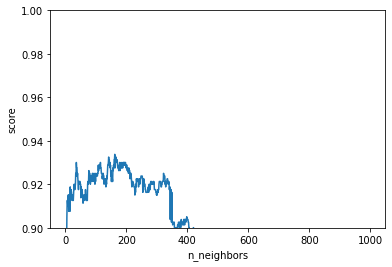

In [35]:
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 1000): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.9, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

### 12/28 kNNのパラメーターチューニングやった↑

In [241]:
#Gradient boosting #test_size=0.30
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6893
[LightGBM] [Info] Number of data points in the train set: 2801, number of used features: 357
[LightGBM] [Info] Start training from score -0.692790
[LightGBM] [Info] Start training from score -0.693504
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.594746
[2]	valid_0's multi_logloss: 0.519003
[3]	valid_0's multi_logloss: 0.457829
[4]	valid_0's multi_logloss: 0.409963
[5]	valid_0's multi_logloss: 0.369502
[6]	valid_0's multi_logloss: 0.333648
[7]	valid_0's multi_logloss: 0.306842
[8]	valid_0's multi_logloss: 0.277132
[9]	valid_0's multi_logloss: 0.254815
[10]	valid_0's multi_logloss: 0.233985
[11]	valid_0's multi_logloss: 0.216643
[12]	valid_0's multi_logloss: 0.204741
[13]	valid_0's multi_l

In [28]:
#Gradient boosting #test_size=0.20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8151
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 408
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.593743
[2]	valid_0's multi_logloss: 0.51686
[3]	valid_0's multi_logloss: 0.457142
[4]	valid_0's multi_logloss: 0.407963
[5]	valid_0's multi_logloss: 0.361209
[6]	valid_0's multi_logloss: 0.322321
[7]	valid_0's multi_logloss: 0.2907
[8]	valid_0's multi_logloss: 0.264409
[9]	valid_0's multi_logloss: 0.242618
[10]	valid_0's multi_logloss: 0.22535
[11]	valid_0's multi_logloss: 0.208683
[12]	valid_0's multi_logloss: 0.195799
[13]	valid_0's multi_logloss: 0.18323
[14]	valid_0's multi_logloss: 0.172532
[15]	valid_0'

In [57]:
pip install optuna

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11107 sha256=a9b00699571b8d55fc48b6f660a9d3996cae6f704942cd7a52cfd3982b7318e6
  Stored in directory: c:\users\kurokawa\appdata\local\pip\cache\wheels\7f\1a\65\84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip
Note: you may need to restart the kernel to use updated packages.


In [58]:
#Gradient Boostingのパラメータチューニング

# データ準備用
import sklearn.datasets
from sklearn.model_selection import train_test_split
# LightGBMおよび交差検定用
from sklearn.model_selection import KFold
import optuna.integration.lightgbm as lgb

# scikit-learnでお試しデータの準備
#boston = sklearn.datasets.load_boston()
#X_trainval, X_test, y_trainval, y_test = train_test_split(boston.data, boston.target, random_state=0)

# LightGBM用のデータセットに変換
train = lgb.Dataset(X_train, y_train)

# ハイパーパラメータサーチ&モデル構築
params = {'objective': 'regression',
          'metric': 'rmse',
          'random_seed':0} 

# クロスバリデーションによるハイパーパラメータの探索 3fold
tuner = lgb.LightGBMTunerCV(params, train, verbose_eval=100, early_stopping_rounds=100, folds=KFold(n_splits=3))

# ハイパーパラメータ探索の実行
tuner.run()

# サーチしたパラメータの表示
best_params = tuner.best_params
print("  Params: ")
for key, value in best_params.items():
    print("    {}: {}".format(key, value))

[I 2021-11-17 19:27:22,116] A new study created in memory with name: no-name-a90b7767-4347-4202-ae92-429549d51f4f
feature_fraction, val_score: inf:   0%|          | 0/7 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.143964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.191277 + 0.014657


feature_fraction, val_score: 0.191129:  14%|#4        | 1/7 [00:06<00:41,  6.91s/it]

[200]	cv_agg's rmse: 0.19194 + 0.0139222


[I 2021-11-17 19:27:29,070] Trial 0 finished with value: 0.19112932528220264 and parameters: {'feature_fraction': 1.0}. Best is trial 0 with value: 0.19112932528220264.
feature_fraction, val_score: 0.191129:  14%|#4        | 1/7 [00:06<00:41,  6.91s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.158366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.186805 + 0.0121628


feature_fraction, val_score: 0.186205:  29%|##8       | 2/7 [00:12<00:31,  6.40s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.200946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.144851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.184702 + 0.0120625


feature_fraction, val_score: 0.184252:  43%|####2     | 3/7 [00:18<00:24,  6.10s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.142785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183888 + 0.0114078
[200]	cv_agg's rmse: 0.184148 + 0.0111577


feature_fraction, val_score: 0.183505:  57%|#####7    | 4/7 [00:25<00:19,  6.54s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183719 + 0.0131456
[200]	cv_agg's rmse: 0.183976 + 0.0125679


feature_fraction, val_score: 0.183446:  71%|#######1  | 5/7 [00:32<00:13,  6.70s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.172872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.187172 + 0.0112265
[200]	cv_agg's rmse: 0.187874 + 0.0108165


feature_fraction, val_score: 0.183446:  86%|########5 | 6/7 [00:41<00:07,  7.33s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.141113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.190419 + 0.0107603
[200]	cv_agg's rmse: 0.189742 + 0.0100106


num_leaves, val_score: 0.183446:   0%|          | 0/20 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.160317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

num_leaves, val_score: 0.183446:   5%|5         | 1/20 [00:09<03:05,  9.76s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.146875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183411 + 0.0125331
[200]	cv_agg's rmse: 0.184018 + 0.012125


num_leaves, val_score: 0.183379:  10%|#         | 2/20 [00:15<02:12,  7.35s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.146442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.137433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183099 + 0.0133429


num_leaves, val_score: 0.183085:  15%|#5        | 3/20 [00:20<01:43,  6.07s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.141081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.182722 + 0.0128188
[200]	cv_agg's rmse: 0.183391 + 0.012996


num_leaves, val_score: 0.182591:  20%|##        | 4/20 [00:26<01:42,  6.41s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.152270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.140794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  25%|##5       | 5/20 [00:36<01:53,  7.57s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.178759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.142144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.185255 + 0.0140733
[200]	cv_agg's rmse: 0.185552 + 0.0137224


num_leaves, val_score: 0.182591:  30%|###       | 6/20 [00:40<01:30,  6.47s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.170598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

num_leaves, val_score: 0.182591:  35%|###5      | 7/20 [00:50<01:37,  7.49s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.169673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

num_leaves, val_score: 0.182591:  40%|####      | 8/20 [01:00<01:38,  8.21s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.178348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.153354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.150321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183411 + 0.0125331
[200]	cv_agg's rmse: 0.184018 + 0.012125


num_leaves, val_score: 0.182591:  45%|####5     | 9/20 [01:06<01:21,  7.45s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147786 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.138729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.522764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

num_leaves, val_score: 0.182591:  50%|#####     | 10/20 [01:15<01:20,  8.09s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.183391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  55%|#####5    | 11/20 [01:25<01:16,  8.54s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.180084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  60%|######    | 12/20 [01:34<01:10,  8.80s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.183666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  65%|######5   | 13/20 [01:44<01:03,  9.03s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2021-11-17 19:29:56,716] Trial 19 finished with value: 0.18359593280835929 and parameters: {'num_leaves': 76}. Best is trial 10 with value: 0.18259082671633378.
num_leaves, val_score: 0.182591:  65%|######5   | 13/20 [01:44<01:03,  9.03s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.150534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183514 + 0.0131386


num_leaves, val_score: 0.182591:  70%|#######   | 14/20 [01:52<00:52,  8.73s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  75%|#######5  | 15/20 [02:01<00:45,  9.06s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.154797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 0.182591:  80%|########  | 16/20 [02:11<00:37,  9.29s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.153282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.144392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.268992 + 0.00496939
[200]	cv_agg's rmse: 0.246316 + 0.00665845
[300]	cv_agg's rmse: 0.239114 + 0.00739025
[400]	cv_agg's rmse: 0.236083 + 0.00801141
[500]	cv_agg's rmse: 0.234192 + 0.00851284
[600]	cv_agg's rmse: 0.232854 + 0.00876769
[700]	cv_agg's rmse: 0.232 + 0.00914452
[800]	cv_agg's rmse: 0.231418 + 0.00929306
[900]	cv_agg's rmse: 0.230907 + 0.00950773


num_leaves, val_score: 0.182591:  85%|########5 | 17/20 [02:16<00:23,  7.90s/it]

[1000]	cv_agg's rmse: 0.230592 + 0.00966888


C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.155559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.153114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183828 + 0.0122579


num_leaves, val_score: 0.182591:  90%|######### | 18/20 [02:23<00:15,  7.69s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.183275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.150809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.522764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

num_leaves, val_score: 0.182591:  95%|#########5| 19/20 [02:33<00:08,  8.36s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.161399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183716 + 0.012621
[200]	cv_agg's rmse: 0.184474 + 0.0123232


bagging, val_score: 0.182591:   0%|          | 0/10 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.146693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	cv_agg's rmse: 0.185907 + 0.0139903
[200]	cv_agg's rmse: 0.185652 + 0.0129656


bagging, val_score: 0.182591:  10%|#         | 1/10 [00:08<01:12,  8.08s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.148496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

bagging, val_score: 0.182591:  20%|##        | 2/10 [00:16<01:07,  8.41s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.142187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

bagging, val_score: 0.182591:  20%|##        | 2/10 [00:26<01:07,  8.41s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


bagging, val_score: 0.182591:  30%|###       | 3/10 [00:26<01:01,  8.82s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.145727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

bagging, val_score: 0.182591:  40%|####      | 4/10 [00:35<00:53,  8.88s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.157172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[100]	cv_agg's rmse: 0.185434 + 0.0126108
[200]	cv_agg's rmse: 0.186046 + 0.0117025


bagging, val_score: 0.182591:  50%|#####     | 5/10 [00:42<00:42,  8.47s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.147985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.185367 + 0.0132243
[200]	cv_agg's rmse: 0.185571 + 0.0130017


bagging, val_score: 0.182591:  60%|######    | 6/10 [00:51<00:34,  8.56s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.150213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Info] Start training from score 0.492505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

bagging, val_score: 0.182591:  70%|#######   | 7/10 [01:00<00:26,  8.71s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2021-11-17 19:31:54,531] Trial 33 finished with value: 0.189598561911677 and parameters: {'bagging_fraction': 0.6175478603029758, 'bagging_freq': 6}. Best is trial 32 with value: 0.18461530865719447.
bagging, val_score: 0.182591:  70%|#######   | 7/10 [01:00<00:26,  8.71s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.137967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.18282 + 0.0127992


bagging, val_score: 0.182591:  80%|########  | 8/10 [01:07<00:16,  8.29s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183735 + 0.0127778


bagging, val_score: 0.182591:  90%|######### | 9/10 [01:14<00:07,  7.88s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.139129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

feature_fraction_stage2, val_score: 0.182591:   0%|          | 0/6 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.159676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.18341 + 0.0128251
[200]	cv_agg's rmse: 0.183613 + 0.0128677


feature_fraction_stage2, val_score: 0.182591:  17%|#6        | 1/6 [00:08<00:43,  8.69s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.177634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.147105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.146459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.184387 + 0.0121033


feature_fraction_stage2, val_score: 0.182591:  33%|###3      | 2/6 [00:15<00:29,  7.49s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.165133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.140090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.184103 + 0.0124261
[200]	cv_agg's rmse: 0.184364 + 0.0120094


feature_fraction_stage2, val_score: 0.182591:  50%|#####     | 3/6 [00:22<00:22,  7.43s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.18353 + 0.013693


feature_fraction_stage2, val_score: 0.182591:  67%|######6   | 4/6 [00:29<00:14,  7.04s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.153867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.184604 + 0.0129472
[200]	cv_agg's rmse: 0.185442 + 0.0125355


feature_fraction_stage2, val_score: 0.182591:  83%|########3 | 5/6 [00:36<00:07,  7.26s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183574 + 0.011729


regularization_factors, val_score: 0.182591:   0%|          | 0/20 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used features: 7938
[LightGBM] [Info] Start training from score 0.484199
[

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182591:   0%|          | 0/20 [00:07<?, ?it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


regularization_factors, val_score: 0.182591:   5%|5         | 1/20 [00:07<02:25,  7.66s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.145198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183549 + 0.0132619
[200]	cv_agg's rmse: 0.184394 + 0.0126898


regularization_factors, val_score: 0.182591:  10%|#         | 2/20 [00:14<02:13,  7.41s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182424:  15%|#5        | 3/20 [00:23<02:12,  7.78s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.143951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  20%|##        | 4/20 [00:29<01:57,  7.36s/it][I 2021-11-17 19:33:30,452] Trial 46 finished with value: 0.18204559360776915 and parameters: {'lambda_l1': 2.1297776718897609e-07, 'lambda_l2': 6.037755039787012}. Best is trial 46 with value: 0.18204559360776915.


[200]	cv_agg's rmse: 0.182437 + 0.0130985


regularization_factors, val_score: 0.182046:  20%|##        | 4/20 [00:29<01:57,  7.36s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.139645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183701 + 0.0131296


regularization_factors, val_score: 0.182046:  25%|##5       | 5/20 [00:36<01:47,  7.17s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.165411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183432 + 0.0126206
[200]	cv_agg's rmse: 0.184221 + 0.0121697


regularization_factors, val_score: 0.182046:  30%|###       | 6/20 [00:43<01:39,  7.14s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.153843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183593 + 0.0125189


regularization_factors, val_score: 0.182046:  35%|###5      | 7/20 [00:50<01:32,  7.08s/it]

[200]	cv_agg's rmse: 0.184018 + 0.0120347


[I 2021-11-17 19:33:51,313] Trial 49 finished with value: 0.18358405597435146 and parameters: {'lambda_l1': 2.0508481573488274e-07, 'lambda_l2': 0.03299610581719649}. Best is trial 46 with value: 0.18204559360776915.
regularization_factors, val_score: 0.182046:  35%|###5      | 7/20 [00:50<01:32,  7.08s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.162414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.142652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  40%|####      | 8/20 [00:58<01:25,  7.16s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.165642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.146041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.183572 + 0.012163
[200]	cv_agg's rmse: 0.184065 + 0.0120912


regularization_factors, val_score: 0.182046:  45%|####5     | 9/20 [01:05<01:18,  7.14s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.164844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.154062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  50%|#####     | 10/20 [01:12<01:13,  7.34s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.141914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.182722 + 0.0128188
[200]	cv_agg's rmse: 0.183201 + 0.012829


regularization_factors, val_score: 0.182046:  55%|#####5    | 11/20 [01:20<01:05,  7.29s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  60%|######    | 12/20 [01:25<00:53,  6.73s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.172715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	cv_agg's rmse: 0.183396 + 0.0127632


regularization_factors, val_score: 0.182046:  65%|######5   | 13/20 [01:31<00:46,  6.63s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.165506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.142326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.182722 + 0.0128188
[200]	cv_agg's rmse: 0.183201 + 0.012829


regularization_factors, val_score: 0.182046:  70%|#######   | 14/20 [01:39<00:40,  6.77s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.160654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.143867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	cv_agg's rmse: 0.183317 + 0.0125579


regularization_factors, val_score: 0.182046:  75%|#######5  | 15/20 [01:45<00:33,  6.74s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.140436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  80%|########  | 16/20 [01:53<00:28,  7.09s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.153835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.149600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.182722 + 0.0128188
[200]	cv_agg's rmse: 0.183162 + 0.0128826


regularization_factors, val_score: 0.182046:  85%|########5 | 17/20 [02:00<00:21,  7.07s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.148770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.145962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  90%|######### | 18/20 [02:07<00:14,  7.05s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.165058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.154064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

regularization_factors, val_score: 0.182046:  95%|#########5| 19/20 [02:14<00:06,  6.88s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.170297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.154449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.142178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	cv_agg's rmse: 0.182786 + 0.0128445


min_data_in_leaf, val_score: 0.182046:   0%|          | 0/5 [00:00<?, ?it/s]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.156442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

min_data_in_leaf, val_score: 0.175770:  20%|##        | 1/5 [00:07<00:29,  7.33s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.164498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

min_data_in_leaf, val_score: 0.175770:  40%|####      | 2/5 [00:17<00:26,  8.79s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.154368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.153360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

min_data_in_leaf, val_score: 0.175770:  60%|######    | 3/5 [00:26<00:18,  9.16s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.148660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Nu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

min_data_in_leaf, val_score: 0.175770:  80%|########  | 4/5 [00:35<00:08,  8.95s/it]C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:577: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1867, number of used features: 7938
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.142487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24499
[LightGBM] [Info] Number of data points in the train set: 1868, number of used featu

C:\Users\Kurokawa\anaconda3\lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	cv_agg's rmse: 0.172852 + 0.0131016


min_data_in_leaf, val_score: 0.172760: 100%|##########| 5/5 [00:43<00:00,  8.64s/it]

  Params: 
    objective: regression
    metric: rmse
    random_seed: 0
    feature_pre_filter: False
    lambda_l1: 2.1297776718897609e-07
    lambda_l2: 6.037755039787012
    num_leaves: 41
    feature_fraction: 0.7
    bagging_fraction: 1.0
    bagging_freq: 0
    min_child_samples: 5


In [61]:
pip install tensorflow

In [40]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

import tensorflow as tf

from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
#from keras.optimizers import SGD
from tensorflow.keras.optimizers import SGD
#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam 
from keras.utils import np_utils
from keras.callbacks import EarlyStopping 

from sklearn import datasets
from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

### 12/26 NNやり直し↓

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [26]:
print(X_train)

[[0.         0.19914923 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [31]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 9909


In [41]:
print("X_testの行数:",(X_test.shape[0]))
print("X_testの行数:",(X_test.shape[1]))

X_testの行数: 801
X_testの行数: 9909


In [33]:
import tensorflow as tf  # ライブラリ「TensorFlow」のtensorflowパッケージをインポート
from tensorflow.keras import layers    # レイヤー関連モジュールのインポート

# 定数（モデル定義時に必要となるもの）
INPUT_ROWS = 3201         # 入力行の数： 3201行
INPUT_COLS = 9909         # 入力列の数： 9909列
                        # 入力（特徴）の数： 784（＝28行×28列）
LAYER1_NEURONS = 128    # ニューロンの数： 128
LAYER2_NEURONS = 32     # ニューロンの数： 32
OUTPUT_RESULTS = 2     # 出力結果の数： 2（＝「0」～「1」2クラスに分類）

# 過学習対策でドロップアウトを使う場合はコメントオフ：
DROPOUT1_RATE = 0.2     # 第1隠れ層から第2隠れ層へのドロップ率： 0.2（20％）

# 変数（モデル定義時に必要となるもの）
activation1 = layers.ReLU(name='activation1')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
activation2 = layers.ReLU(name='activation2')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
#act_output = layers.Softmax(name='act_output') # 活性化関数（出力層用）： Softmax関数（固定）
act_output = layers.Activation('sigmoid', name='act_output') # 活性化関数（出力層用）： Sigmoid関数（固定）

# tf.keras.Modelによるモデルの定義
class NeuralNetwork(tf.keras.Model):

  # レイヤー（層）を定義
  def __init__(self):
    super().__init__()

    # 入力層：入力データのフラット化（Flatten）
    self.flatten_input = layers.Flatten(    # 行列データのフラット化
      input_shape=(INPUT_ROWS, INPUT_COLS), # 入力の形状（＝入力層）※タプル形式
      name='flatten_input')
 
    # 隠れ層：1つ目のレイヤー（layer）
    self.layer1 = layers.Dense(       # 全結合層（線形変換）
      # 入力ユニット数は、前の出力ユニット数が使われるので、指定不要
      LAYER1_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer1')

    # 第1レイヤーの後でドロップアウトを使う場合はコメントオフ：
    #self.dropput1 = layers.Dropout(  # ドロップアウト
      #DROPOUT1_RATE,                 # 何％ドロップするか
      #name='dropput1')
    
    # 隠れ層：2つ目のレイヤー（layer）
    self.layer2 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer2')

    # 出力層
    self.layer_out = layers.Dense(    # 全結合層
      OUTPUT_RESULTS,                 # 出力結果への出力ユニット数
      name='layer_out')

  # フォワードパスを定義
  def call(self, x, train_mode=True):
    x = self.flatten_input(x)         # 入力データのフラット化

    # 「出力＝活性化関数（第n層（入力））」の形式で記述
    x = activation1(self.layer1(x))   # 活性化関数は変数として定義

    #ドロップアウトを使う場合はコメントオフ：
    #if train_mode:                   # 訓練時のみ……
    #  x = self.dropput2(x)           # ……ドロップアウト（不活性化）

    x = activation2(self.layer2(x))   # 活性化関数は変数として定義

    x = act_output(self.layer_out(x)) # ※活性化関数は「softmax」固定
    return x

In [34]:
# モデル（NeuralNetworkクラス）のインスタンス化
model = NeuralNetwork()

In [35]:
# 定数（学習方法設計時に必要となる数値）
LOSS = 'sparse_categorical_crossentropy'  # 損失関数：多クラス分類用の交差エントロピー
METRICS = ['accuracy']                    # 評価関数：正解率
OPTIMIZER = tf.keras.optimizers.Adam      # 最適化：Adam
LEARNING_RATE = 0.001                     # 学習率： 0.001（学習率の調整）

# 学習方法を定義する
model.compile(optimizer=OPTIMIZER(learning_rate=LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)            # 精度（分類では正解率。回帰では損失）

In [37]:
#TF-idfで分析
#test_size=20
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [38]:
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 17ms/step - loss: 6.2889e-06 - accuracy: 1.0000 - val_loss: 0.1647 - val_accuracy: 0.9376
Epoch 2/100
27/27 [==============================] - 0s 16ms/step - loss: 6.1309e-06 - accuracy: 1.0000 - val_loss: 0.1649 - val_accuracy: 0.9376
Epoch 3/100
27/27 [==============================] - 0s 16ms/step - loss: 5.9818e-06 - accuracy: 1.0000 - val_loss: 0.1651 - val_accuracy: 0.9360
Epoch 4/100
27/27 [==============================] - 0s 16ms/step - loss: 5.8346e-06 - accuracy: 1.0000 - val_loss: 0.1654 - val_accuracy: 0.9360
Epoch 5/100
27/27 [==============================] - 0s 16ms/step - loss: 5.6927e-06 - accuracy: 1.0000 - val_loss: 0.1656 - val_accuracy: 0.9360
Epoch 6/100
27/27 [==============================] - 0s 16ms/step - loss: 5.5561e-06 - accuracy: 1.0000 - val_loss: 0.1659 - val_accuracy: 0.9360
Epoch 7/100
27/27 [==============================] - 0s 16ms/step - loss: 5.4203e-06 - accuracy: 1.0000 - val_loss: 0.1661 -

In [39]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[366  27]
 [ 15 393]]
-----------------------------------------
Accuracy: 0.947565543071161
-----------------------------------------
F1 score: 0.9492753623188407
-----------------------------------------
Precision: 0.9357142857142857
-----------------------------------------
Recall: 0.9632352941176471
-----------------------------------------
True Negative Rate: 0.9312977099236641


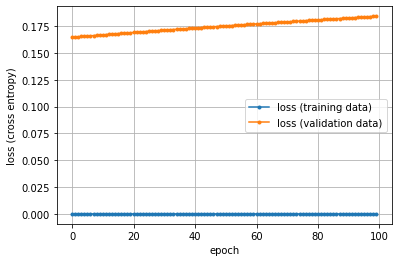

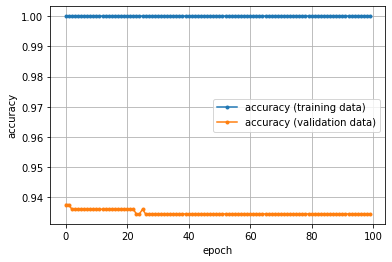

In [40]:
import matplotlib.pyplot as plt

# 学習結果（損失＝交差エントロピー）のグラフを描画
plt.figure()
train_loss = hist.history['loss']
valid_loss = hist.history['val_loss']
epochs = len(train_loss)
plt.plot(range(epochs), train_loss, marker='.', label='loss (training data)')
plt.plot(range(epochs), valid_loss, marker='.', label='loss (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss (cross entropy)')

# 評価関数（正解率）のグラフを描画
plt.figure()
train_mae = hist.history['accuracy']
valid_mae = hist.history['val_accuracy']
epochs = len(train_mae)
plt.plot(range(epochs), train_mae, marker='.', label='accuracy (training data)')
plt.plot(range(epochs), valid_mae, marker='.', label='accuracy (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('accuracy')

plt.show()

### 12/26 NNやり直し↑

### 12/28 NN ↓

In [63]:
import tensorflow as tf  # ライブラリ「TensorFlow」のtensorflowパッケージをインポート
from tensorflow.keras import layers    # レイヤー関連モジュールのインポート

# 定数（モデル定義時に必要となるもの）
INPUT_ROWS = 3201         # 入力行の数： 3201行
INPUT_COLS = 9909         # 入力列の数： 9909列
                        # 入力（特徴）の数： 784（＝28行×28列）
    
LAYER1_NEURONS = 512
LAYER2_NEURONS = 128    # ニューロンの数： 128
LAYER3_NEURONS = 32     # ニューロンの数： 32
OUTPUT_RESULTS = 2     # 出力結果の数： 2（＝「0」～「1」2クラスに分類）

# 過学習対策でドロップアウトを使う場合はコメントオフ：
DROPOUT1_RATE = 0.2     # 第1隠れ層から第2隠れ層へのドロップ率： 0.2（20％）

# 変数（モデル定義時に必要となるもの）
activation1 = layers.ReLU(name='activation1')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
activation2 = layers.ReLU(name='activation2')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
#act_output = layers.Softmax(name='act_output') # 活性化関数（出力層用）： Softmax関数（固定）
act_output = layers.Activation('sigmoid', name='act_output') # 活性化関数（出力層用）： Sigmoid関数（固定）

# tf.keras.Modelによるモデルの定義
class NeuralNetwork(tf.keras.Model):

  # レイヤー（層）を定義
  def __init__(self):
    super().__init__()

    # 入力層：入力データのフラット化（Flatten）
    self.flatten_input = layers.Flatten(    # 行列データのフラット化
      input_shape=(INPUT_ROWS, INPUT_COLS), # 入力の形状（＝入力層）※タプル形式
      name='flatten_input')
 
    # 隠れ層：1つ目のレイヤー（layer）
    self.layer1 = layers.Dense(       # 全結合層（線形変換）
      # 入力ユニット数は、前の出力ユニット数が使われるので、指定不要
      LAYER1_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer1')

    # 第1レイヤーの後でドロップアウトを使う場合はコメントオフ：
    #self.dropput1 = layers.Dropout(  # ドロップアウト
      #DROPOUT1_RATE,                 # 何％ドロップするか
      #name='dropput1')
    
    # 隠れ層：2つ目のレイヤー（layer）
    self.layer2 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer2')
    
    # 隠れ層：3つ目のレイヤー（layer）
    self.layer3 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer3')
    
    # 出力層
    self.layer_out = layers.Dense(    # 全結合層
      OUTPUT_RESULTS,                 # 出力結果への出力ユニット数
      name='layer_out')

  # フォワードパスを定義
  def call(self, x, train_mode=True):
    x = self.flatten_input(x)         # 入力データのフラット化

    # 「出力＝活性化関数（第n層（入力））」の形式で記述
    x = activation1(self.layer1(x))   # 活性化関数は変数として定義

    #ドロップアウトを使う場合はコメントオフ：
    #if train_mode:                   # 訓練時のみ……
    #  x = self.dropput2(x)           # ……ドロップアウト（不活性化）

    x = activation2(self.layer2(x))   # 活性化関数は変数として定義

    x = act_output(self.layer_out(x)) # ※活性化関数は「softmax」固定
    return x

In [64]:
# モデル（NeuralNetworkクラス）のインスタンス化
model = NeuralNetwork()

In [65]:
# 定数（学習方法設計時に必要となる数値）
LOSS = 'sparse_categorical_crossentropy'  # 損失関数：多クラス分類用の交差エントロピー
METRICS = ['accuracy']                    # 評価関数：正解率
OPTIMIZER = tf.keras.optimizers.Adam      # 最適化：Adam
LEARNING_RATE = 0.001                     # 学習率： 0.001（学習率の調整）

# 学習方法を定義する
model.compile(optimizer=OPTIMIZER(learning_rate=LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)            # 精度（分類では正解率。回帰では損失）

In [66]:
#TF-idfで分析
#test_size=20
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [67]:
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 1s 12ms/step - loss: 0.5191 - accuracy: 0.8500 - val_loss: 0.2196 - val_accuracy: 0.9345
Epoch 2/100
27/27 [==============================] - 0s 7ms/step - loss: 0.0765 - accuracy: 0.9766 - val_loss: 0.1336 - val_accuracy: 0.9454
Epoch 3/100
27/27 [==============================] - 0s 7ms/step - loss: 0.0060 - accuracy: 0.9988 - val_loss: 0.1410 - val_accuracy: 0.9470
Epoch 4/100
27/27 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.1471 - val_accuracy: 0.9407
Epoch 5/100
27/27 [==============================] - 0s 7ms/step - loss: 8.2418e-04 - accuracy: 1.0000 - val_loss: 0.1467 - val_accuracy: 0.9438
Epoch 6/100
27/27 [==============================] - 0s 7ms/step - loss: 5.4081e-04 - accuracy: 1.0000 - val_loss: 0.1495 - val_accuracy: 0.9423
Epoch 7/100
27/27 [==============================] - 0s 7ms/step - loss: 3.9832e-04 - accuracy: 1.0000 - val_loss: 0.1502 - val_accuracy: 0.9423


In [56]:
#最終的にDNNで用いた結果はこれ
#Layer3つ
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[370  23]
 [ 15 393]]
-----------------------------------------
Accuracy: 0.9525593008739076
-----------------------------------------
F1 score: 0.9538834951456311
-----------------------------------------
Precision: 0.9447115384615384
-----------------------------------------
Recall: 0.9632352941176471
-----------------------------------------
True Negative Rate: 0.9414758269720102


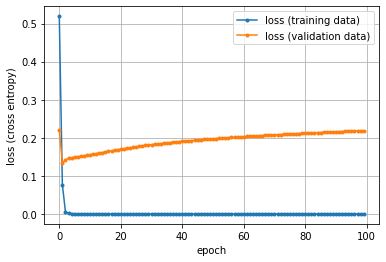

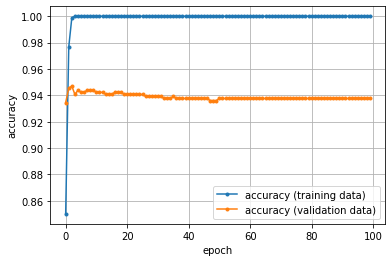

In [70]:
import matplotlib.pyplot as plt

# 学習結果（損失＝交差エントロピー）のグラフを描画
plt.figure()
train_loss = hist.history['loss']
valid_loss = hist.history['val_loss']
epochs = len(train_loss)
plt.plot(range(epochs), train_loss, marker='.', label='loss (training data)')
plt.plot(range(epochs), valid_loss, marker='.', label='loss (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss (cross entropy)')

# 評価関数（正解率）のグラフを描画
plt.figure()
train_mae = hist.history['accuracy']
valid_mae = hist.history['val_accuracy']
epochs = len(train_mae)
plt.plot(range(epochs), train_mae, marker='.', label='accuracy (training data)')
plt.plot(range(epochs), valid_mae, marker='.', label='accuracy (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('accuracy')

plt.show()

### 12/28 NN ↑

In [30]:
import tensorflow as tf  # ライブラリ「TensorFlow」のtensorflowパッケージをインポート
from tensorflow.keras import layers    # レイヤー関連モジュールのインポート

# 定数（モデル定義時に必要となるもの）
INPUT_ROWS = 28         # 入力行の数： 28行
INPUT_COLS = 28         # 入力列の数： 28列
                        # 入力（特徴）の数： 784（＝28行×28列）
LAYER1_NEURONS = 128    # ニューロンの数： 128
LAYER2_NEURONS = 32     # ニューロンの数： 32
OUTPUT_RESULTS = 2     # 出力結果の数： 2（＝「0」～「1」2クラスに分類）

# 過学習対策でドロップアウトを使う場合はコメントオフ：
DROPOUT1_RATE = 0.2     # 第1隠れ層から第2隠れ層へのドロップ率： 0.2（20％）

# 変数（モデル定義時に必要となるもの）
activation1 = layers.ReLU(name='activation1')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
activation2 = layers.ReLU(name='activation2')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
#act_output = layers.Softmax(name='act_output') # 活性化関数（出力層用）： Softmax関数（固定）
act_output = layers.Activation('sigmoid', name='act_output') # 活性化関数（出力層用）： Sigmoid関数（固定）

# tf.keras.Modelによるモデルの定義
class NeuralNetwork(tf.keras.Model):

  # レイヤー（層）を定義
  def __init__(self):
    super().__init__()

    # 入力層：入力データのフラット化（Flatten）
    self.flatten_input = layers.Flatten(    # 行列データのフラット化
      input_shape=(INPUT_ROWS, INPUT_COLS), # 入力の形状（＝入力層）※タプル形式
      name='flatten_input')
 
    # 隠れ層：1つ目のレイヤー（layer）
    self.layer1 = layers.Dense(       # 全結合層（線形変換）
      # 入力ユニット数は、前の出力ユニット数が使われるので、指定不要
      LAYER1_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer1')

    # 第1レイヤーの後でドロップアウトを使う場合はコメントオフ：
    #self.dropput1 = layers.Dropout(  # ドロップアウト
      #DROPOUT1_RATE,                 # 何％ドロップするか
      #name='dropput1')
    
    # 隠れ層：2つ目のレイヤー（layer）
    self.layer2 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer2')

    # 出力層
    self.layer_out = layers.Dense(    # 全結合層
      OUTPUT_RESULTS,                 # 出力結果への出力ユニット数
      name='layer_out')

  # フォワードパスを定義
  def call(self, x, train_mode=True):
    x = self.flatten_input(x)         # 入力データのフラット化

    # 「出力＝活性化関数（第n層（入力））」の形式で記述
    x = activation1(self.layer1(x))   # 活性化関数は変数として定義

    #ドロップアウトを使う場合はコメントオフ：
    #if train_mode:                   # 訓練時のみ……
    #  x = self.dropput2(x)           # ……ドロップアウト（不活性化）

    x = activation2(self.layer2(x))   # 活性化関数は変数として定義

    x = act_output(self.layer_out(x)) # ※活性化関数は「softmax」固定
    return x

In [31]:
# モデル（NeuralNetworkクラス）のインスタンス化
model = NeuralNetwork()

In [32]:
# 定数（学習方法設計時に必要となる数値）
LOSS = 'sparse_categorical_crossentropy'  # 損失関数：多クラス分類用の交差エントロピー
METRICS = ['accuracy']                    # 評価関数：正解率
OPTIMIZER = tf.keras.optimizers.Adam      # 最適化：Adam
LEARNING_RATE = 0.001                     # 学習率： 0.001（学習率の調整）

# 学習方法を定義する
model.compile(optimizer=OPTIMIZER(learning_rate=LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)            # 精度（分類では正解率。回帰では損失）

In [51]:
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
24/24 [==============================] - 2s 14ms/step - loss: 0.6552 - accuracy: 0.7375 - val_loss: 0.5724 - val_accuracy: 0.8663
Epoch 2/100
24/24 [==============================] - 0s 6ms/step - loss: 0.4097 - accuracy: 0.9612 - val_loss: 0.3249 - val_accuracy: 0.9198
Epoch 3/100
24/24 [==============================] - 0s 6ms/step - loss: 0.1477 - accuracy: 0.9862 - val_loss: 0.1978 - val_accuracy: 0.9305
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 0.0420 - accuracy: 0.9960 - val_loss: 0.1608 - val_accuracy: 0.9340
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 0.0153 - accuracy: 0.9996 - val_loss: 0.1503 - val_accuracy: 0.9340
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 0.0078 - accuracy: 0.9996 - val_loss: 0.1520 - val_accuracy: 0.9305
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.1479 - val_accuracy: 0.9376
Epoch 8/100


In [58]:
#test_size=0.30
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[552  48]
 [ 34 567]]
-----------------------------------------
Accuracy: 0.9317235636969192
-----------------------------------------
F1 score: 0.9325657894736843
-----------------------------------------
Precision: 0.9219512195121952
-----------------------------------------
Recall: 0.9434276206322796


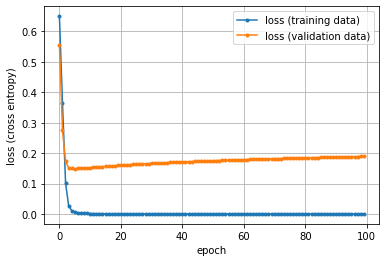

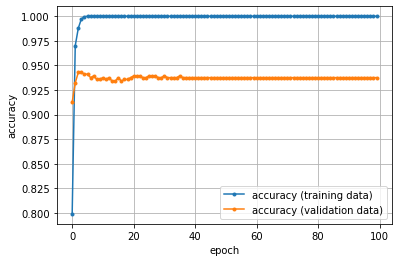

In [155]:
import matplotlib.pyplot as plt

# 学習結果（損失＝交差エントロピー）のグラフを描画
plt.figure()
train_loss = hist.history['loss']
valid_loss = hist.history['val_loss']
epochs = len(train_loss)
plt.plot(range(epochs), train_loss, marker='.', label='loss (training data)')
plt.plot(range(epochs), valid_loss, marker='.', label='loss (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss (cross entropy)')

# 評価関数（正解率）のグラフを描画
plt.figure()
train_mae = hist.history['accuracy']
valid_mae = hist.history['val_accuracy']
epochs = len(train_mae)
plt.plot(range(epochs), train_mae, marker='.', label='accuracy (training data)')
plt.plot(range(epochs), valid_mae, marker='.', label='accuracy (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('accuracy')

plt.show()

In [42]:
#TF-idfで分析
#test_size=20
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X=tfidf.fit_transform(df.iloc[:,0]).toarray()
y=df.iloc[:,1].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [43]:
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 1s 18ms/step - loss: 1.7355e-07 - accuracy: 1.0000 - val_loss: 0.1997 - val_accuracy: 0.9392
Epoch 2/100
27/27 [==============================] - 0s 16ms/step - loss: 1.7053e-07 - accuracy: 1.0000 - val_loss: 0.1999 - val_accuracy: 0.9392
Epoch 3/100
27/27 [==============================] - 0s 16ms/step - loss: 1.6801e-07 - accuracy: 1.0000 - val_loss: 0.2000 - val_accuracy: 0.9392
Epoch 4/100
27/27 [==============================] - 0s 16ms/step - loss: 1.6536e-07 - accuracy: 1.0000 - val_loss: 0.2002 - val_accuracy: 0.9392
Epoch 5/100
27/27 [==============================] - 0s 16ms/step - loss: 1.6242e-07 - accuracy: 1.0000 - val_loss: 0.2003 - val_accuracy: 0.9392
Epoch 6/100
27/27 [==============================] - 0s 16ms/step - loss: 1.6005e-07 - accuracy: 1.0000 - val_loss: 0.2005 - val_accuracy: 0.9392
Epoch 7/100
27/27 [==============================] - 0s 16ms/step - loss: 1.5763e-07 - accuracy: 1.0000 - val_loss: 0.2006 -

In [44]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[367  26]
 [ 21 387]]
-----------------------------------------
Accuracy: 0.9413233458177278
-----------------------------------------
F1 score: 0.9427527405602923
-----------------------------------------
Precision: 0.937046004842615
-----------------------------------------
Recall: 0.9485294117647058
-----------------------------------------
True Negative Rate: 0.9338422391857506


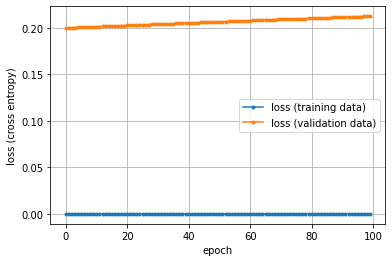

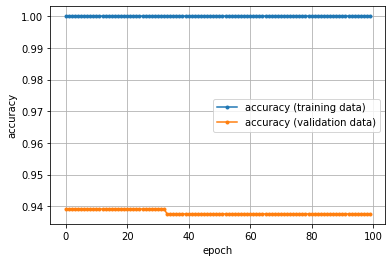

In [45]:
import matplotlib.pyplot as plt

# 学習結果（損失＝交差エントロピー）のグラフを描画
plt.figure()
train_loss = hist.history['loss']
valid_loss = hist.history['val_loss']
epochs = len(train_loss)
plt.plot(range(epochs), train_loss, marker='.', label='loss (training data)')
plt.plot(range(epochs), valid_loss, marker='.', label='loss (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss (cross entropy)')

# 評価関数（正解率）のグラフを描画
plt.figure()
train_mae = hist.history['accuracy']
valid_mae = hist.history['val_accuracy']
epochs = len(train_mae)
plt.plot(range(epochs), train_mae, marker='.', label='accuracy (training data)')
plt.plot(range(epochs), valid_mae, marker='.', label='accuracy (validation data)')
plt.legend(loc='best')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('accuracy')

plt.show()

### ↓12/10 ニューラルネットワーク　パラメーターチューニング　optuna

In [121]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [123]:
pip install optuna

  Using cached optuna-2.10.0-py3-none-any.whl (308 kB)
  Using cached cmaes-0.8.2-py3-none-any.whl (15 kB)
  Using cached colorlog-6.6.0-py2.py3-none-any.whl (11 kB)
  Using cached alembic-1.7.5-py3-none-any.whl (209 kB)
  Using cached importlib_resources-5.4.0-py3-none-any.whl (28 kB)
  Using cached stevedore-3.5.0-py3-none-any.whl (49 kB)
  Using cached prettytable-2.4.0-py3-none-any.whl (24 kB)
  Using cached autopage-0.4.0-py3-none-any.whl (20 kB)
  Using cached pyperclip-1.8.2-py3-none-any.whl
  Using cached pyreadline3-3.3-py3-none-any.whl (95 kB)
Note: you may need to restart the kernel to use updated packages.


In [28]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import os 
from multiprocessing import Process
import numpy as np
import random
import optuna 

In [125]:
class VariableModel(nn.Module):
    def __init__(self, n_layers, n_nodes):
        super(VariableModel, self).__init__()
        self.input_layer = nn.Linear(5,n_nodes)
        layer = [nn.Linear(n_nodes,n_nodes) for _ in range(n_layers)]
        self.layer = nn.ModuleList(layer)
        self.output_layer = nn.Linear(n_nodes,1)

    def forward(self, x):
        x = self.input_layer(x)
        x = F.relu(x)
        for i in range(len(self.layer)):
            x = self.layer[i](x)
            x = F.relu(x)

        out = self.output_layer(x)
        return out

In [128]:
def objective(trial):
    # チューニングするパラメータの範囲の設定
    n_layers = trial.suggest_int('n_layers', 1, 4)
    n_nodes = trial.suggest_int('n_nodes', 2, 64)
    lr = trial.suggest_loguniform('lr', 1e-5, 1e-1)
    optimizer_name = trial.suggest_categorical('optimizer_name', ['SGD', 'Adam'])

    # その他の定数
    n_epochs = 1000
    n_sample = 10000
    seed = 42

    # インプットと正解ラベルの生成
    from sklearn.feature_extraction.text import TfidfVectorizer
    tfidf = TfidfVectorizer()
    X=tfidf.fit_transform(df.iloc[:,0]).toarray()
    y=df.iloc[:,1].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)
    
    X_train=torch.from_numpy(X_train).clone()
    X_test=torch.from_numpy(X_test).clone()
    y_train=torch.from_numpy(y_train).clone()
    y_test=torch.from_numpy(y_test).clone()

    # モデルのインスタンス化
    model = VariableModel(n_layers=n_layers, n_nodes=n_nodes)
    # 最適化手法のパラメータ設定
    if optimizer_name == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
    elif optimizer_name == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=lr)
    else:
        raise ValueError('Invalid optimizer_name')
    # loss関数の定義
    criterion = nn.MSELoss()

    # 学習ループ
    model.train()
    for epoch in range(n_epochs):
        optimizer.zero_grad()
        preds = model(X_train)
        loss = criterion(preds, y_train)
        loss.backward()
        optimizer.step()
        if (epoch + 1) % 100 == 0:
            print(f'Epoch [{epoch + 1}/{n_epochs}], Loss: {loss.item():.2f}')
    
    # テストセットで評価
    preds_test = model(X_test)
    test_loss = criterion(preds_test, y_test)
    # テストセットのLossを返す
    return test_loss.item()

In [133]:
study_name = 'exampleNN'
study = optuna.create_study(study_name=study_name)
study.optimize(objective, n_trials=100)

[I 2021-12-10 15:24:39,086] A new study created in memory with name: exampleNN
[W 2021-12-10 15:24:39,520] Trial 0 failed because of the following error: RuntimeError('mat1 and mat2 shapes cannot be multiplied (3201x9909 and 5x45)')
Traceback (most recent call last):
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\optuna\study\_optimize.py", line 213, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\Kurokawa\AppData\Local\Temp/ipykernel_7444/1294826665.py", line 41, in objective
    preds = model(X_train)
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\torch\nn\modules\module.py", line 1102, in _call_impl
    return forward_call(*input, **kwargs)
  File "C:\Users\Kurokawa\AppData\Local\Temp/ipykernel_7444/2748651128.py", line 10, in forward
    x = self.input_layer(x)
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\torch\nn\modules\module.py", line 1102, in _call_impl
    return forward_call(*input, **kwargs

RuntimeError: mat1 and mat2 shapes cannot be multiplied (3201x9909 and 5x45)

↓後で実行する

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

# 多層パーセプトロン
from sklearn.neural_network import MLPClassifier
# グリッドサーチを行うためのパラメーター
parameters = [{'hidden_layer_sizes': [8, 16, 32, (8, 8), (8, 8, 8)], 
               'solver': ['adam'], 'activation': ['relu'],
              'learning_rate_init': [0.1, 0.01, 0.001]}]
#グリッドサーチ実行
classifier = GridSearchCV(MLPClassifier(max_iter=10000, early_stopping=True), 
                          parameters, cv=3, n_jobs=-1)
classifier.fit(X_train, y_train)
print("Accuracy score (train): ", classifier.score(X_train, y_train))
print("Accuracy score (test): ", classifier.score(X_test, y_test))
print(classifier.best_estimator_) # ベストのパラメーターを持つ分類器

In [30]:
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier

### -------------------------------------------------------------

#### 層の深さを固定しない場合　https://qiita.com/maskot1977/items/ed698a67b091b5516ab4
↓後で実行する

In [26]:
# 目的関数
def objective(trial):
    h1, = trial.suggest_int('h1', 8, 100),
    h2, = trial.suggest_int('h2', 8, 100),
    h3, = trial.suggest_int('h3', 8, 100),
    h4, = trial.suggest_int('h4', 8, 100),
    h5, = trial.suggest_int('h5', 8, 100),
    hidden_layer_sizes = []
    n = trial.suggest_int('n', 1, 5)
    for h in [h1, h2, h3, h4, h5]:
        hidden_layer_sizes.append(h)
        if len(hidden_layer_sizes) == n:
            break
    learning_rate_init, = trial.suggest_loguniform('learning_rate_init', 0.001, 0.1),
    classifier = MLPClassifier(max_iter=10000, early_stopping=True,
                                    hidden_layer_sizes=hidden_layer_sizes,
                                    learning_rate_init=learning_rate_init, 
                                    solver='adam', activation='relu')
    classifier.fit(X_train, y_train)
    #return classifier.score(X_train, y_train)
    #return classifier.score(X_test, y_test)
    return np.linalg.norm(y_train - classifier.predict_proba(X_train)[:, 1], ord=1)

In [32]:
study = optuna.create_study(direction='maximize')
#study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

[I 2021-12-15 18:28:35,954] A new study created in memory with name: no-name-30ea37fa-c8a3-4d1d-8b66-7b35f9450aa4
[I 2021-12-15 18:28:45,515] Trial 0 finished with value: 1064.3560464615048 and parameters: {'h1': 41, 'h2': 92, 'h3': 84, 'h4': 79, 'h5': 85, 'n': 5, 'learning_rate_init': 0.004063735467414604}. Best is trial 0 with value: 1064.3560464615048.
[I 2021-12-15 18:29:23,252] Trial 1 finished with value: 16.85349696329675 and parameters: {'h1': 81, 'h2': 34, 'h3': 76, 'h4': 32, 'h5': 17, 'n': 1, 'learning_rate_init': 0.0875237764389433}. Best is trial 0 with value: 1064.3560464615048.
[I 2021-12-15 18:29:30,136] Trial 2 finished with value: 23.4846504064215 and parameters: {'h1': 22, 'h2': 100, 'h3': 72, 'h4': 51, 'h5': 36, 'n': 3, 'learning_rate_init': 0.06214871331438109}. Best is trial 0 with value: 1064.3560464615048.
[I 2021-12-15 18:29:39,152] Trial 3 finished with value: 140.49106777081732 and parameters: {'h1': 42, 'h2': 66, 'h3': 83, 'h4': 87, 'h5': 36, 'n': 2, 'learnin

In [33]:
study.best_params

{'h1': 25,
 'h2': 55,
 'h3': 54,
 'h4': 44,
 'h5': 31,
 'n': 3,
 'learning_rate_init': 0.0011418855429978923}

In [35]:
study.best_value

1083.0859458995276

### -----------------------------------------------------------------------------------

In [36]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

[I 2021-12-15 19:17:09,831] A new study created in memory with name: no-name-c1cc6ff2-83b9-496d-8009-aab292cb321e
[I 2021-12-15 19:17:21,335] Trial 0 finished with value: 85.73456043153334 and parameters: {'h1': 42, 'h2': 8, 'h3': 24, 'h4': 75, 'h5': 84, 'n': 5, 'learning_rate_init': 0.001689183977710875}. Best is trial 0 with value: 85.73456043153334.
[I 2021-12-15 19:17:24,847] Trial 1 finished with value: 260.6458722752126 and parameters: {'h1': 11, 'h2': 88, 'h3': 92, 'h4': 93, 'h5': 67, 'n': 4, 'learning_rate_init': 0.013848607750572206}. Best is trial 0 with value: 85.73456043153334.
[I 2021-12-15 19:17:39,399] Trial 2 finished with value: 18.80737137541271 and parameters: {'h1': 57, 'h2': 95, 'h3': 66, 'h4': 66, 'h5': 37, 'n': 4, 'learning_rate_init': 0.04081636288186408}. Best is trial 2 with value: 18.80737137541271.
[I 2021-12-15 19:17:57,557] Trial 3 finished with value: 27.2820960577782 and parameters: {'h1': 73, 'h2': 100, 'h3': 20, 'h4': 77, 'h5': 72, 'n': 3, 'learning_ra

In [37]:
study.best_params

{'h1': 65,
 'h2': 77,
 'h3': 52,
 'h4': 82,
 'h5': 41,
 'n': 4,
 'learning_rate_init': 0.003746801068776039}

In [38]:
study.best_value

14.096122254019196

-----------------------------------------------------------------------------------------

In [79]:
pip install GPy

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for paramz: filename=paramz-0.9.5-py3-none-any.whl size=102565 sha256=66f539c8008f71248494abb645e98cd6f08fb8c56472f2cb7cf9f5f502e9e5e9
  Stored in directory: c:\users\kurokawa\appdata\local\pip\cache\wheels\66\78\6c\d98cb437834de5e29381786b4ba8a77ea68cca74653ab62713
Successfully built paramz
Note: you may need to restart the kernel to use updated packages.


In [80]:
pip install GPyOpt

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for GPyOpt: filename=GPyOpt-1.2.6-py3-none-any.whl size=83609 sha256=0e217a0849b8f1b0c6b4876f898a5786b84bd681ba2cc2c70521922868e0b7d1
  Stored in directory: c:\users\kurokawa\appdata\local\pip\cache\wheels\5e\0b\6f\65b7572b74ce7c031e4c68556b8fd43c210f5b9415937c429d
Successfully built GPyOpt
Note: you may need to restart the kernel to use updated packages.


In [94]:
pip install --upgrade numpy --user

Note: you may need to restart the kernel to use updated packages.


In [98]:
pip install pycocotools --no-binary pycocotools

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
Skipping wheel build for pycocotools, due to binaries being disabled for it.
    Running setup.py install for pycocotools: started
    Running setup.py install for pycocotools: finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\Kurokawa\anaconda3\envs\tf26-py38\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Kurokawa\\AppData\\Local\\Temp\\pip-install-_6ojvuhq\\pycocotools_888efc13ea51474382c85c308863290f\\setup.py'"'"'; __file__='"'"'C:\\Users\\Kurokawa\\AppData\\Local\\Temp\\pip-install-_6ojvuhq\\pycocotools_888efc13ea51474382c85c308863290f\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record 'C:\Users\Kurokawa\AppData\Local\Temp\pip-record-hj0noejm\install-record.txt' --single-version-externally-managed --compile --install-headers 'C:\Users\Kurokawa\anaconda3\envs\tf26-py38\Include\pycocotools'
         cwd: C:\Users\Kurokawa\AppData\Local\Temp\pip-install-

In [97]:
import GPy, GPyOpt
import numpy as np
import pandas as pds
import random
from keras.layers import Activation, Dropout, BatchNormalization, Dense
from keras.models import Sequential
from keras.datasets import mnist
from keras.metrics import categorical_crossentropy
from keras.utils import np_utils
#from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 88 from C header, got 80 from PyObject

In [83]:
# MNIST class
class MNIST():
    def __init__(self,
                 l1_out=512, 
                 l2_out=512, 
                 l1_drop=0.2, 
                 l2_drop=0.2, 
                 bn1=0,
                 bn2=0,
                 batch_size=100, 
                 epochs=10, 
                 validation_split=0.1):
        self.l1_out = l1_out
        self.l2_out = l2_out
        self.l1_drop = l1_drop
        self.l2_drop = l2_drop
        self.bn1 = bn1
        self.bn2 = bn2
        self.batch_size = batch_size
        self.epochs = epochs
        self.validation_split = validation_split
        self.__x_train, self.__x_test, self.__y_train, self.__y_test = self.mnist_data()
        self.__model = self.mnist_model()
        
    # load mnist data from keras dataset
    def mnist_data(self):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)
        return X_train, X_test, y_train, y_test
    
     
    # mnist model
    def mnist_model(self):
        model = Sequential()
        model.add(Dense(self.l1_out, input_shape=(784,)))
        if self.bn1 == 0:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        model.add(Dropout(self.l1_drop))
        model.add(Dense(self.l2_out))
        if self.bn2 == 0:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        model.add(Dropout(self.l2_drop))
        model.add(Dense(10))
        model.add(Activation('softmax'))
        model.compile(loss='categorical_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

        return model
    
    # fit mnist model
    def mnist_fit(self):
        early_stopping = EarlyStopping(patience=0, verbose=1)
        
        self.__model.fit(self.__x_train, self.__y_train,
                       batch_size=self.batch_size,
                       epochs=self.epochs,
                       verbose=0,
                       validation_split=self.validation_split,
                       callbacks=[early_stopping])
    
    # evaluate mnist model
    def mnist_evaluate(self):
        self.mnist_fit()
        
        evaluation = self.__model.evaluate(self.__x_test, self.__y_test, batch_size=self.batch_size, verbose=0)
        return evaluation
    

In [84]:
def run_mnist(l1_out=512, l2_out=512, 
              l1_drop=0.2, l2_drop=0.2, 
              bn1=0, bn2=0,
              batch_size=100, epochs=10, validation_split=0.1):
    
    _mnist = MNIST()
    mnist_evaluation = _mnist.mnist_evaluate()
    return mnist_evaluation

In [85]:
# bounds for hyper-parameters in mnist model
# the bounds dict should be in order of continuous type and then discrete type
bounds = [{'name': 'validation_split', 'type': 'continuous',  'domain': (0.0, 0.3)},
          {'name': 'l1_drop',          'type': 'continuous',  'domain': (0.0, 0.3)},
          {'name': 'l2_drop',          'type': 'continuous',  'domain': (0.0, 0.3)},
          {'name': 'l1_out',           'type': 'discrete',    'domain': (64, 128, 256, 512, 1024)},
          {'name': 'l2_out',           'type': 'discrete',    'domain': (64, 128, 256, 512, 1024)},
          {'name': 'bn1',              'type': 'discrete',    'domain': (0, 1)},
          {'name': 'bn2',              'type': 'discrete',    'domain': (0, 1)},
          {'name': 'batch_size',       'type': 'discrete',    'domain': (10, 100, 500)},
          {'name': 'epochs',           'type': 'discrete',    'domain': (5, 10, 20)}]

In [86]:
def f(x):
    print(x)
    evaluation = run_mnist(
        l1_drop = int(x[:,1]), 
        l2_drop = int(x[:,2]), 
        l1_out = float(x[:,3]),
        l2_out = float(x[:,4]), 
        bn1 = int(x[:,5]),
        bn2 = int(x[:,6]),
        batch_size = int(x[:,7]), 
        epochs = int(x[:,8]), 
        validation_split = float(x[:,0]))
    print("loss:{0} \t\t accuracy:{1}".format(evaluation[0], evaluation[1]))
    return evaluation[0]

In [88]:
opt_mnist = GPyOpt.methods.BayesianOptimization(f=f, domain=bounds)

NameError: name 'GPyOpt' is not defined

In [89]:
opt_mnist.run_optimization(max_iter=15)

NameError: name 'opt_mnist' is not defined

In [90]:
optbounds = {
    'validation_split' : opt_mnist.x_opt[0],
    'l1_drop' : opt_mnist.x_opt[1],
    'l2_drop' : opt_mnist.x_opt[2],
    'l1_out' : opt_mnist.x_opt[3],
    'l2_out' : opt_mnist.x_opt[4],
    'bn1' : opt_mnist.x_opt[5],
    'bn2' : opt_mnist.x_opt[6],
    'batch_size' : opt_mnist.x_opt[7],
    'epochs' : opt_mnist.x_opt[8],
}

NameError: name 'opt_mnist' is not defined

In [91]:
print("optimized parameters: {0}".format(optbounds))
print("optimized loss: {0}".format(opt_mnist.fx_opt))

NameError: name 'optbounds' is not defined

In [65]:
##########################################
import numpy as np
from sklearn import datasets, preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.utils import np_utils
from keras import backend as K
from keras.wrappers.scikit_learn import KerasClassifier

num_classes = y_test.shape[0]
print(num_classes)

# Define model for iris classification
def iris_model(activation="relu", optimizer="adam", out_dim=100):
    model = Sequential()
    model.add(Dense(out_dim, input_dim=4, activation=activation))
    model.add(Dense(num_classes, activation="softmax"))
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

# Define options for parameters
activation = ["relu", "sigmoid"]
optimizer = ["adam", "adagrad"]
out_dim = [100, 200]
nb_epoch = [10, 25]
batch_size = [5, 10]


# Retrieve model and parameter into GridSearchCV
model = KerasClassifier(build_fn=iris_model, verbose=0)
param_grid = dict(activation=activation, 
                  optimizer=optimizer, 
                  out_dim=out_dim, 
                  nb_epoch=nb_epoch, 
                  batch_size=batch_size)
grid = GridSearchCV(estimator=model, param_grid=param_grid)


# Run grid search
grid_result = grid.fit(X_train, y_train)


# Get the best score and the optimized mode
print (grid_result.best_score_)
print (grid_result.best_params_)

# Evaluate the model with test data
grid_eval = grid.predict(X_test)
def y_binary(i):
    if   i == 0: return [1, 0, 0]
    elif i == 1: return [0, 1, 0]
    elif i == 2: return [0, 0, 1]
y_eval = np.array([y_binary(i) for i in grid_eval])
accuracy = (y_eval == y_te)
print (np.count_nonzero(accuracy == True) / (accuracy.shape[0] * accuracy.shape[1]))


# Now see the optimized model
model = iris_model(activation=grid_result.best_params_['activation'], 
                   optimizer=grid_result.best_params_['optimizer'], 
                   out_dim=grid_result.best_params_['out_dim'])
model.summary()
############################################################################

1201


C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
160 fits failed out of a total of 160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\wrappers\scikit_learn.py", line 219, in fit
    return super(KerasClassifier, self).fit(x, y, **kwargs)
  File "C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\wrappers\scikit_lea

ValueError: in user code:

    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\training.py:853 train_function  *
        return step_function(self, iterator)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\training.py:842 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\training.py:835 run_step  **
        outputs = model.train_step(data)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\training.py:787 train_step
        y_pred = self(x, training=True)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\base_layer.py:1020 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    C:\Users\Kurokawa\anaconda3\envs\tf26-py38\lib\site-packages\keras\engine\input_spec.py:247 assert_input_compatibility
        if hasattr(value, 'value'):

    ValueError: Input 0 of layer "sequential_804" is incompatible with the layer: expected axis -1of input shape to have value 4, but received input with shape (None, 9909)


### Tf-idfで教師なし学習

In [22]:
df_unlabelled = pd.DataFrame(unlabelled_preprocessed_List)
df_unlabelled.head()

NameError: name 'unlabelled_preprocessed_List' is not defined

In [219]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
#>>> # 行列を転置
#>>> cust_array = cust_array.T

X=tfidf.fit_transform(df_unlabelled.iloc[:,0]).toarray()
 
# クラスタ分析を実行 (クラスタ数=4)
pred = KMeans(n_clusters=4).fit_predict(X)
print(pred)
print(len(pred))

[3 0 0 ... 0 0 0]
2001


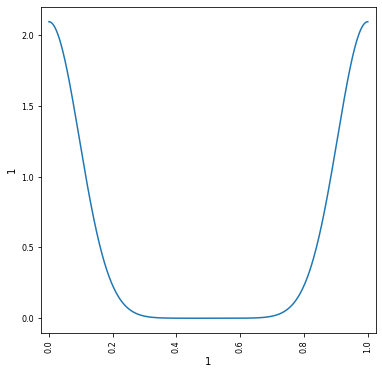

In [223]:
import matplotlib.pyplot as plt
%matplotlib inline
from pandas import plotting

color_codes = {0:'#00FF00', 1:'#FF0000', 2:'#0000FF', 3:'#00000F'}
colors = [color_codes[x] for x in pred]
plotting.scatter_matrix(df[df.columns[1:]],figsize=(6,6), color=colors, alpha=0.8, diagonal='kde')   #データのプロット
plt.show()

### TextBlobで教師あり学習

### polarityで判定

In [31]:
#TextBlobのpolarityで判定する
df_preprocessed_polarity=pd.DataFrame(preprocessed_polarity)
df_preprocessed_polarity.head()
df_preprocessed_polarity.tail()

,0,1
3997,0.0,0
3998,0.0,0
3999,0.0,0
4000,0.0,0
4001,0.0,0


In [ ]:
#TextBlobのpolarityで判定する  絵文字あり
emoji_df_preprocessed_polarity=pd.DataFrame(emoji_preprocessed_polarity)

In [32]:
df_preprocessed_polarity_list = [[] for i in range(4002)]

for i in range(4002):
  df_preprocessed_polarity_list[i].append(df_preprocessed_polarity.iloc[i,0])

df_preprocessed_polarity_list_Dataframe=pd.DataFrame(df_preprocessed_polarity_list)
print(df_preprocessed_polarity_list_Dataframe)

             0
0     0.000000
1     0.050000
2     0.400000
3     0.044545
4     0.163636
...        ...
3997  0.000000
3998  0.000000
3999  0.000000
4000  0.000000
4001  0.000000

[4002 rows x 1 columns]


In [303]:
#絵文字あり
emoji_df_preprocessed_polarity_list = [[] for i in range(4002)]

for i in range(4002):
  emoji_df_preprocessed_polarity_list[i].append(emoji_df_preprocessed_polarity.iloc[i,0])

emoji_df_preprocessed_polarity_list_Dataframe=pd.DataFrame(emoji_df_preprocessed_polarity_list)
print(emoji_df_preprocessed_polarity_list_Dataframe)

             0
0     0.000000
1     0.050000
2     0.400000
3     0.044545
4     0.163636
...        ...
3997  0.000000
3998  0.000000
3999  0.000000
4000  0.000000
4001  0.000000

[4002 rows x 1 columns]


In [33]:
X=df_preprocessed_polarity_list_Dataframe.values
print(X)
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df_preprocessed_polarity.iloc[:,1].values

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

[[0.  ]
 [0.05]
 [0.4 ]
 ...
 [0.  ]
 [0.  ]
 [0.  ]]


In [135]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 1
X_testの行数: 3201
X_testの行数: 1


In [34]:
print(X_train)

[[0.05075758]
 [0.        ]
 [0.        ]
 ...
 [0.        ]
 [0.        ]
 [0.33333333]]


In [35]:
print(y_train)

[0 1 1 ... 1 0 0]


In [304]:
#絵文字あり
X=emoji_df_preprocessed_polarity_list_Dataframe.values
print(X)
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=emoji_df_preprocessed_polarity.iloc[:,1].values

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

[[0.  ]
 [0.05]
 [0.4 ]
 ...
 [0.  ]
 [0.  ]
 [0.  ]]


In [137]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 1
X_testの行数: 3201
X_testの行数: 1


In [47]:
from sklearn.metrics import confusion_matrix,accuracy_score, f1_score,precision_score,recall_score

In [219]:
#パラメーターチューニング#絵文字なし
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  1000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  1349
通常のランダムフォレストモデルによる予測値         :  -0.619
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.629
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.604


In [220]:
#絵文字なしRandomforest#polarity
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =1349,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 
polarity_matrix = confusion_matrix(y_test, y_pred)
print(polarity_matrix)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('F1 score:', f1_score(y_test,y_pred))
print('Precision:', precision_score(y_test,y_pred))
print('Recall:', recall_score(y_test,y_pred))
TN = polarity_matrix[0][0]
FP = polarity_matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[325  68]
 [253 155]]
Accuracy: 0.599250936329588
F1 score: 0.49128367670364503
Precision: 0.695067264573991
Recall: 0.3799019607843137
-----------------------------------------
True Negative Rate: 0.8269720101781171


In [223]:
#パラメーターチューニング#絵文字あり
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  1000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  1310
通常のランダムフォレストモデルによる予測値         :  -0.614
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.624
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.589


In [224]:
#絵文字ありRandomforest#polarity
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =1310,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 
polarity_matrix = confusion_matrix(y_test, y_pred)
print(polarity_matrix)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('F1 score:', f1_score(y_test,y_pred))
print('Precision:', precision_score(y_test,y_pred))
print('Recall:', recall_score(y_test,y_pred))
TN = polarity_matrix[0][0]
FP = polarity_matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[328  65]
 [253 155]]
Accuracy: 0.602996254681648
F1 score: 0.4936305732484076
Precision: 0.7045454545454546
Recall: 0.3799019607843137
-----------------------------------------
True Negative Rate: 0.8346055979643766


In [256]:
#SVC
from sklearn.svm import SVC

model = SVC(gamma='auto')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[ 62 331]
 [ 61 347]]
-----------------------------------------
Accuracy: 0.5106117353308365
-----------------------------------------
F1 score: 0.6390423572744015
-----------------------------------------
Precision: 0.5117994100294986
-----------------------------------------
Recall: 0.8504901960784313
-----------------------------------------
True Negative Rate: 0.15776081424936386


In [357]:
#SVC
from sklearn.svm import SVC

model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [258]:
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.svm import LinearSVC

In [259]:
#LinearSVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

model = LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [330  78]]
-----------------------------------------
Accuracy: 0.4868913857677903
-----------------------------------------
F1 score: 0.2751322751322751
-----------------------------------------
Precision: 0.49056603773584906
-----------------------------------------
Recall: 0.19117647058823528
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [260]:
#OnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [52]:
#絵文字あり#SVC
from sklearn.svm import SVC

model = SVC(gamma='auto')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[ 62 331]
 [ 59 349]]
-----------------------------------------
Accuracy: 0.5131086142322098
-----------------------------------------
F1 score: 0.6415441176470588
-----------------------------------------
Precision: 0.513235294117647
-----------------------------------------
Recall: 0.8553921568627451
-----------------------------------------
True Negative Rate: 0.15776081424936386


In [264]:
#絵文字あり#LinearSVC
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.multioutput import MultiOutputClassifier

model = LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [330  78]]
-----------------------------------------
Accuracy: 0.4868913857677903
-----------------------------------------
F1 score: 0.2751322751322751
-----------------------------------------
Precision: 0.49056603773584906
-----------------------------------------
Recall: 0.19117647058823528
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [265]:
#絵文字あり#OnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [267]:
#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [332  76]]
-----------------------------------------
Accuracy: 0.484394506866417
-----------------------------------------
F1 score: 0.26902654867256637
-----------------------------------------
Precision: 0.4840764331210191
-----------------------------------------
Recall: 0.18627450980392157
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [53]:
#絵文字あり#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [332  76]]
-----------------------------------------
Accuracy: 0.484394506866417
-----------------------------------------
F1 score: 0.26902654867256637
-----------------------------------------
Precision: 0.4840764331210191
-----------------------------------------
Recall: 0.18627450980392157
-----------------------------------------
True Negative Rate: 0.7938931297709924


[1] score: 0.57428
[2] score: 0.55056
[3] score: 0.56804
[4] score: 0.57303
[5] score: 0.59426
[6] score: 0.59301
[7] score: 0.58801
[8] score: 0.59051
[9] score: 0.59551
[10] score: 0.59176
[11] score: 0.58427
[12] score: 0.58427
[13] score: 0.58926
[14] score: 0.59301
[15] score: 0.60799
[16] score: 0.60300
[17] score: 0.61298
[18] score: 0.60424
[19] score: 0.60050
[20] score: 0.59675
[21] score: 0.60424
[22] score: 0.59551
[23] score: 0.59925
[24] score: 0.59301
[25] score: 0.60050
[26] score: 0.59051
[27] score: 0.59925
[28] score: 0.60300
[29] score: 0.59925
[30] score: 0.59800
[31] score: 0.60175
[32] score: 0.60424
[33] score: 0.61049
[34] score: 0.60674
[35] score: 0.61298
[36] score: 0.60175
[37] score: 0.60924
[38] score: 0.60424
[39] score: 0.60799
[40] score: 0.60424
[41] score: 0.60175
[42] score: 0.60674
[43] score: 0.61049
[44] score: 0.60674
[45] score: 0.61174
[46] score: 0.60674
[47] score: 0.60924
[48] score: 0.60549
[49] score: 0.61049
[50] score: 0.60300
[51] scor

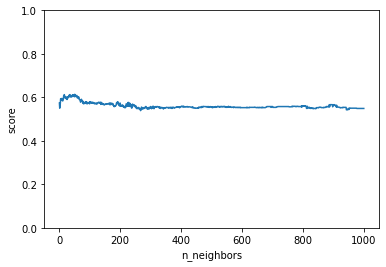

In [293]:
#絵文字なし　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 1000): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [301]:
#kNN
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=51)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[330  63]
 [246 162]]
-----------------------------------------
Accuracy: 0.6142322097378277
-----------------------------------------
F1 score: 0.5118483412322274
-----------------------------------------
Precision: 0.72
-----------------------------------------
Recall: 0.39705882352941174
-----------------------------------------
True Negative Rate: 0.8396946564885496


[1] score: 0.57803
[2] score: 0.55056
[3] score: 0.57553
[4] score: 0.55930
[5] score: 0.59675
[6] score: 0.58302
[7] score: 0.58926
[8] score: 0.59051
[9] score: 0.59426
[10] score: 0.59925
[11] score: 0.60300
[12] score: 0.59176
[13] score: 0.59800
[14] score: 0.59551
[15] score: 0.60674
[16] score: 0.60300
[17] score: 0.60424
[18] score: 0.59551
[19] score: 0.59675
[20] score: 0.59301
[21] score: 0.60050
[22] score: 0.58926
[23] score: 0.59426
[24] score: 0.60050
[25] score: 0.60674
[26] score: 0.59551
[27] score: 0.59551
[28] score: 0.60050
[29] score: 0.59800
[30] score: 0.59426
[31] score: 0.60175
[32] score: 0.59800
[33] score: 0.60549
[34] score: 0.60300
[35] score: 0.60300
[36] score: 0.60050
[37] score: 0.59925
[38] score: 0.59800
[39] score: 0.60424
[40] score: 0.60300
[41] score: 0.60799
[42] score: 0.60424
[43] score: 0.60799
[44] score: 0.60549
[45] score: 0.61423
[46] score: 0.60549
[47] score: 0.60549
[48] score: 0.60050
[49] score: 0.61049
[50] score: 0.59925
[51] scor

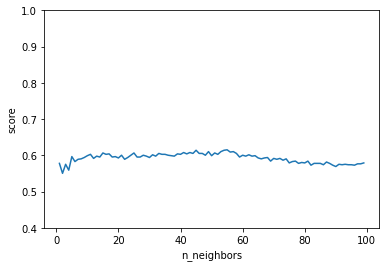

In [297]:
#絵文字あり　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 100): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.4, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [305]:
#絵文字あり#kNN
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=55)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[317  76]
 [232 176]]
-----------------------------------------
Accuracy: 0.6154806491885143
-----------------------------------------
F1 score: 0.5333333333333333
-----------------------------------------
Precision: 0.6984126984126984
-----------------------------------------
Recall: 0.43137254901960786
-----------------------------------------
True Negative Rate: 0.806615776081425


In [270]:
#勾配ブースティング
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 1
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.685125
[2]	valid_0's multi_logloss: 0.679296
[3]	valid_0's multi_logloss: 0.673892
[4]	valid_0's multi_logloss: 0.669412
[5]	valid_0's multi_logloss: 0.66562
[6]	valid_0's multi_logloss: 0.662723
[7]	valid_0's multi_logloss: 0.660206
[8]	valid_0's multi_logloss: 0.659038
[9]	valid_0's multi_logloss: 0.658714
[10]	valid_0's multi_logloss: 0.658556
[11]	valid_0's multi_logloss: 0.657597
[12]	valid_0's multi_logloss: 0.65736
[13]	valid_0's multi_logloss: 0.657784
[14]	valid_0's multi_logloss: 0.658051
[15]	valid_0'

In [57]:
#絵文字あり勾配ブースティング
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 1
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.685908
[2]	valid_0's multi_logloss: 0.679203
[3]	valid_0's multi_logloss: 0.673054
[4]	valid_0's multi_logloss: 0.668571
[5]	valid_0's multi_logloss: 0.664536
[6]	valid_0's multi_logloss: 0.661385
[7]	valid_0's multi_logloss: 0.658755
[8]	valid_0's multi_logloss: 0.657079
[9]	valid_0's multi_logloss: 0.656471
[10]	valid_0's multi_logloss: 0.655864
[11]	valid_0's multi_logloss: 0.655966
[12]	valid_0's multi_logloss: 0.655499
[13]	valid_0's multi_logloss: 0.656079
[14]	valid_0's multi_logloss: 0.656226
[15]	valid_

In [212]:
#パターン1
import tensorflow as tf  # ライブラリ「TensorFlow」のtensorflowパッケージをインポート
from tensorflow.keras import layers    # レイヤー関連モジュールのインポート

# 定数（モデル定義時に必要となるもの）
INPUT_ROWS = 3201         # 入力行の数： 3201行
INPUT_COLS = 1         # 入力列の数： 1列
                        # 入力（特徴）の数： 784（＝28行×28列）
LAYER1_NEURONS = 128    # ニューロンの数： 128
LAYER2_NEURONS = 32     # ニューロンの数： 32
OUTPUT_RESULTS = 2     # 出力結果の数： 2（＝「0」～「1」2クラスに分類）

# 過学習対策でドロップアウトを使う場合はコメントオフ：
DROPOUT1_RATE = 0.2     # 第1隠れ層から第2隠れ層へのドロップ率： 0.2（20％）

# 変数（モデル定義時に必要となるもの）
activation1 = layers.ReLU(name='activation1')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
activation2 = layers.ReLU(name='activation2')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
#act_output = layers.Softmax(name='act_output') # 活性化関数（出力層用）： Softmax関数（固定）
act_output = layers.Activation('sigmoid', name='act_output') # 活性化関数（出力層用）： Sigmoid関数（固定）

# tf.keras.Modelによるモデルの定義
class NeuralNetwork(tf.keras.Model):

  # レイヤー（層）を定義
  def __init__(self):
    super().__init__()

    # 入力層：入力データのフラット化（Flatten）
    self.flatten_input = layers.Flatten(    # 行列データのフラット化
      input_shape=(INPUT_ROWS, INPUT_COLS), # 入力の形状（＝入力層）※タプル形式
      name='flatten_input')
 
    # 隠れ層：1つ目のレイヤー（layer）
    self.layer1 = layers.Dense(       # 全結合層（線形変換）
      # 入力ユニット数は、前の出力ユニット数が使われるので、指定不要
      LAYER1_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer1')

    # 第1レイヤーの後でドロップアウトを使う場合はコメントオフ：
    #self.dropput1 = layers.Dropout(  # ドロップアウト
      #DROPOUT1_RATE,                 # 何％ドロップするか
      #name='dropput1')
    
    # 隠れ層：2つ目のレイヤー（layer）
    self.layer2 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer2')

    # 出力層
    self.layer_out = layers.Dense(    # 全結合層
      OUTPUT_RESULTS,                 # 出力結果への出力ユニット数
      name='layer_out')

  # フォワードパスを定義
  def call(self, x, train_mode=True):
    x = self.flatten_input(x)         # 入力データのフラット化

    # 「出力＝活性化関数（第n層（入力））」の形式で記述
    x = activation1(self.layer1(x))   # 活性化関数は変数として定義

    #ドロップアウトを使う場合はコメントオフ：
    #if train_mode:                   # 訓練時のみ……
    #  x = self.dropput2(x)           # ……ドロップアウト（不活性化）

    x = activation2(self.layer2(x))   # 活性化関数は変数として定義

    x = act_output(self.layer_out(x)) # ※活性化関数は「softmax」固定
    return x

In [207]:
#パターン2
import tensorflow as tf  # ライブラリ「TensorFlow」のtensorflowパッケージをインポート
from tensorflow.keras import layers    # レイヤー関連モジュールのインポート

# 定数（モデル定義時に必要となるもの）
INPUT_ROWS = 3201         # 入力行の数： 3201行
INPUT_COLS = 1         # 入力列の数： 9909列
                        # 入力（特徴）の数： 784（＝28行×28列）
    
LAYER1_NEURONS = 512
LAYER2_NEURONS = 128    # ニューロンの数： 128
LAYER3_NEURONS = 32     # ニューロンの数： 32
OUTPUT_RESULTS = 2     # 出力結果の数： 2（＝「0」～「1」2クラスに分類）

# 過学習対策でドロップアウトを使う場合はコメントオフ：
DROPOUT1_RATE = 0.2     # 第1隠れ層から第2隠れ層へのドロップ率： 0.2（20％）

# 変数（モデル定義時に必要となるもの）
activation1 = layers.ReLU(name='activation1')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
activation2 = layers.ReLU(name='activation2')  # 活性化関数（隠れ層用）： ReLU関数（変更可能）
#act_output = layers.Softmax(name='act_output') # 活性化関数（出力層用）： Softmax関数（固定）
act_output = layers.Activation('sigmoid', name='act_output') # 活性化関数（出力層用）： Sigmoid関数（固定）

# tf.keras.Modelによるモデルの定義
class NeuralNetwork(tf.keras.Model):

  # レイヤー（層）を定義
  def __init__(self):
    super().__init__()

    # 入力層：入力データのフラット化（Flatten）
    self.flatten_input = layers.Flatten(    # 行列データのフラット化
      input_shape=(INPUT_ROWS, INPUT_COLS), # 入力の形状（＝入力層）※タプル形式
      name='flatten_input')
 
    # 隠れ層：1つ目のレイヤー（layer）
    self.layer1 = layers.Dense(       # 全結合層（線形変換）
      # 入力ユニット数は、前の出力ユニット数が使われるので、指定不要
      LAYER1_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer1')

    # 第1レイヤーの後でドロップアウトを使う場合はコメントオフ：
    #self.dropput1 = layers.Dropout(  # ドロップアウト
      #DROPOUT1_RATE,                 # 何％ドロップするか
      #name='dropput1')
    
    # 隠れ層：2つ目のレイヤー（layer）
    self.layer2 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer2')
    
    # 隠れ層：3つ目のレイヤー（layer）
    self.layer3 = layers.Dense(       # 全結合層
      LAYER2_NEURONS,                 # 次のレイヤーへの出力ユニット数
      name='layer3')
    
    # 出力層
    self.layer_out = layers.Dense(    # 全結合層
      OUTPUT_RESULTS,                 # 出力結果への出力ユニット数
      name='layer_out')

  # フォワードパスを定義
  def call(self, x, train_mode=True):
    x = self.flatten_input(x)         # 入力データのフラット化

    # 「出力＝活性化関数（第n層（入力））」の形式で記述
    x = activation1(self.layer1(x))   # 活性化関数は変数として定義

    #ドロップアウトを使う場合はコメントオフ：
    #if train_mode:                   # 訓練時のみ……
    #  x = self.dropput2(x)           # ……ドロップアウト（不活性化）

    x = activation2(self.layer2(x))   # 活性化関数は変数として定義

    x = act_output(self.layer_out(x)) # ※活性化関数は「softmax」固定
    return x

In [213]:
model = NeuralNetwork()

In [214]:
# 定数（学習方法設計時に必要となる数値）
LOSS = 'sparse_categorical_crossentropy'  # 損失関数：多クラス分類用の交差エントロピー
METRICS = ['accuracy']                    # 評価関数：正解率
OPTIMIZER = tf.keras.optimizers.Adam      # 最適化：Adam
LEARNING_RATE = 0.001                     # 学習率： 0.001（学習率の調整）

# 学習方法を定義する
model.compile(optimizer=OPTIMIZER(learning_rate=LEARNING_RATE),
              loss=LOSS,
              metrics=METRICS)            # 精度（分類では正解率。回帰では損失）

In [145]:
#パターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 2s 11ms/step - loss: 0.6932 - accuracy: 0.5309 - val_loss: 0.6925 - val_accuracy: 0.5242
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6915 - accuracy: 0.5379 - val_loss: 0.6913 - val_accuracy: 0.5242
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6903 - accuracy: 0.5367 - val_loss: 0.6909 - val_accuracy: 0.5367
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6898 - accuracy: 0.5473 - val_loss: 0.6897 - val_accuracy: 0.5491
Epoch 5/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6894 - accuracy: 0.5496 - val_loss: 0.6892 - val_accuracy: 0.5523
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6883 - accuracy: 0.5574 - val_loss: 0.6887 - val_accuracy: 0.5507
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6877 - accuracy: 0.5562 - val_loss: 0.6877 - val_accuracy: 0.5585
Epoch 8/100


In [154]:
#パターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 1s 9ms/step - loss: 0.6939 - accuracy: 0.5121 - val_loss: 0.6926 - val_accuracy: 0.5304
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6919 - accuracy: 0.5375 - val_loss: 0.6906 - val_accuracy: 0.5195
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6910 - accuracy: 0.5523 - val_loss: 0.6905 - val_accuracy: 0.5460
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6901 - accuracy: 0.5422 - val_loss: 0.6892 - val_accuracy: 0.5335
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6894 - accuracy: 0.5586 - val_loss: 0.6892 - val_accuracy: 0.5351
Epoch 6/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6890 - accuracy: 0.5461 - val_loss: 0.6872 - val_accuracy: 0.5601
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6876 - accuracy: 0.5566 - val_loss: 0.6872 - val_accuracy: 0.5554
Epoch 8/100
2

In [148]:
#絵文字あり#パターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6773 - accuracy: 0.5703 - val_loss: 0.6818 - val_accuracy: 0.5569
Epoch 2/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6762 - accuracy: 0.5746 - val_loss: 0.6806 - val_accuracy: 0.5616
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.5738 - val_loss: 0.6802 - val_accuracy: 0.5647
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6759 - accuracy: 0.5789 - val_loss: 0.6799 - val_accuracy: 0.5601
Epoch 5/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6766 - accuracy: 0.5754 - val_loss: 0.6799 - val_accuracy: 0.5616
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6768 - accuracy: 0.5738 - val_loss: 0.6813 - val_accuracy: 0.5710
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6758 - accuracy: 0.5781 - val_loss: 0.6811 - val_accuracy: 0.5632
Epoch 8/100
2

In [160]:
#絵文字あり#パターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6930 - accuracy: 0.5328 - val_loss: 0.6919 - val_accuracy: 0.5257
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6918 - accuracy: 0.5289 - val_loss: 0.6910 - val_accuracy: 0.5367
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6901 - accuracy: 0.5441 - val_loss: 0.6887 - val_accuracy: 0.5413
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6908 - accuracy: 0.5176 - val_loss: 0.6880 - val_accuracy: 0.5601
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6887 - accuracy: 0.5551 - val_loss: 0.6915 - val_accuracy: 0.5320
Epoch 6/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6882 - accuracy: 0.5539 - val_loss: 0.6873 - val_accuracy: 0.5554
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.5555 - val_loss: 0.6863 - val_accuracy: 0.5413
Epoch 8/100
2

In [146]:
#パターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[295  98]
 [247 161]]
-----------------------------------------
Accuracy: 0.5692883895131086
-----------------------------------------
F1 score: 0.48275862068965514
-----------------------------------------
Precision: 0.6216216216216216
-----------------------------------------
Recall: 0.3946078431372549
-----------------------------------------
True Negative Rate: 0.7506361323155216


In [155]:
#パターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[296  97]
 [250 158]]
-----------------------------------------
Accuracy: 0.5667915106117354
-----------------------------------------
F1 score: 0.4766214177978884
-----------------------------------------
Precision: 0.6196078431372549
-----------------------------------------
Recall: 0.3872549019607843
-----------------------------------------
True Negative Rate: 0.7531806615776081


In [149]:
#絵文字ありパターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[292 101]
 [244 164]]
-----------------------------------------
Accuracy: 0.5692883895131086
-----------------------------------------
F1 score: 0.487369985141159
-----------------------------------------
Precision: 0.6188679245283019
-----------------------------------------
Recall: 0.4019607843137255
-----------------------------------------
True Negative Rate: 0.7430025445292621


In [161]:
#絵文字ありパターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[297  96]
 [252 156]]
-----------------------------------------
Accuracy: 0.5655430711610487
-----------------------------------------
F1 score: 0.4727272727272727
-----------------------------------------
Precision: 0.6190476190476191
-----------------------------------------
Recall: 0.38235294117647056
-----------------------------------------
True Negative Rate: 0.7557251908396947


### subjectivityで判定

In [36]:
#TextBlobのsubjectivityで判定する
df_preprocessed_subjectivity=pd.DataFrame(preprocessed_subjectivity)

In [315]:
#絵文字あり#TextBlobのsubjectivityで判定する
emoji_df_preprocessed_subjectivity=pd.DataFrame(emoji_preprocessed_subjectivity)

In [39]:
df_preprocessed_subjectivity_list = [[] for i in range(4002)]

for i in range(4002):
  df_preprocessed_subjectivity_list[i].append(df_preprocessed_subjectivity.iloc[i,0])

df_preprocessed_subjectivity_list_Dataframe=pd.DataFrame(df_preprocessed_subjectivity_list)

In [316]:
#絵文字あり
emoji_df_preprocessed_subjectivity_list = [[] for i in range(4002)]

for i in range(4002):
  emoji_df_preprocessed_subjectivity_list[i].append(emoji_df_preprocessed_subjectivity.iloc[i,0])

emoji_df_preprocessed_subjectivity_list_Dataframe=pd.DataFrame(emoji_df_preprocessed_subjectivity_list)

In [42]:
X=df_preprocessed_subjectivity_list_Dataframe.values
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df_preprocessed_subjectivity.iloc[:,1].values

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [339]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 1
X_testの行数: 3201
X_testの行数: 1


In [45]:
print(X_train)

[[0.05075758]
 [0.        ]
 [0.        ]
 ...
 [0.        ]
 [0.        ]
 [0.33333333]]


In [44]:
print(X_test)

[[ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.5       ]
 [ 0.        ]
 [ 0.13636364]
 [ 0.14242424]
 [ 0.03333333]
 [ 0.        ]
 [ 0.625     ]
 [ 0.        ]
 [ 0.34666667]
 [ 1.        ]
 [-0.26190476]
 [ 0.175     ]
 [ 0.        ]
 [ 0.30189394]
 [ 0.        ]
 [ 0.4       ]
 [ 0.03333333]
 [ 0.        ]
 [ 0.14375   ]
 [ 0.        ]
 [ 0.        ]
 [ 0.13636364]
 [ 0.        ]
 [-0.3125    ]
 [ 0.01666667]
 [ 0.        ]
 [ 0.13636364]
 [-0.18333333]
 [ 0.13636364]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [-0.2       ]
 [-0.25      ]
 [ 0.        ]
 [-0.175     ]
 [ 0.        ]
 [ 0.28571429]
 [ 0.08333333]
 [ 0.        ]
 [ 0.        ]
 [ 0.08333333]
 [-0.1       ]
 [ 0.        ]
 [ 0.15      ]
 [ 0.15833333]
 [ 0.14242424]
 [ 0.30833333]
 [ 0.2       ]
 [ 0.12121212]
 [-0.1       ]
 [ 0.        ]
 [ 0.        ]
 [-0.1       ]
 [ 0.175     ]
 [ 0.        ]
 [ 0.21212121]
 [ 0.        ]
 [ 0.35      ]
 [ 0.16666667]
 [ 0.        ]
 [ 0.        ]
 [-0.00714

In [46]:
print(y_train)

[0 1 1 ... 1 0 0]


In [47]:
print(y_test)

[0 1 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 0 0 1 1 1 1 1 0 0 0 0 1 1 1 0 1 1 1
 0 1 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 1 0 1 1 1 1 0 1 1 0
 1 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 1 1 1 1 1 1
 1 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0
 0 0 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 0 1
 0 0 1 0 1 1 1 0 0 1 0 0 1 0 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1
 0 0 0 1 1 1 1 0 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0
 1 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1 1 1 1 1 1 0
 1 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 1 0 0 1 0
 0 1 1 1 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 1 1 0 0
 1 1 0 0 0 1 1 1 0 0 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 0 1 1 0 1 0 1 0 1
 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 0 1
 1 0 1 1 0 0 0 1 0 1 1 0 

In [340]:
#絵文字あり
X=emoji_df_preprocessed_subjectivity_list_Dataframe.values
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=emoji_df_preprocessed_subjectivity.iloc[:,1].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [341]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 1
X_testの行数: 3201
X_testの行数: 1


In [228]:
#パラメーターチューニング#絵文字なし
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  1000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  1219
通常のランダムフォレストモデルによる予測値         :  -0.619
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.629
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.584


In [229]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =1219,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[328  65]
 [252 156]]
-----------------------------------------
Accuracy: 0.6042446941323346
-----------------------------------------
F1 score: 0.49602543720190767
-----------------------------------------
Precision: 0.7058823529411765
-----------------------------------------
Recall: 0.38235294117647056
-----------------------------------------
True Negative Rate: 0.8346055979643766


In [234]:
#パラメーターチューニング#絵文字あり
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  1000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  1561
通常のランダムフォレストモデルによる予測値         :  -0.619
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.629
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.599


In [235]:
#絵文字あり#RandomForest
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =1561,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[329  64]
 [256 152]]
-----------------------------------------
Accuracy: 0.6004993757802747
-----------------------------------------
F1 score: 0.4871794871794872
-----------------------------------------
Precision: 0.7037037037037037
-----------------------------------------
Recall: 0.37254901960784315
-----------------------------------------
True Negative Rate: 0.8371501272264631


In [76]:
#SVC
from sklearn.svm import SVC

X=df_preprocessed_subjectivity_list_Dataframe.values
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df_preprocessed_subjectivity.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = SVC(gamma='auto')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[ 62 331]
 [ 61 347]]
-----------------------------------------
Accuracy: 0.5106117353308365
-----------------------------------------
F1 score: 0.6390423572744015
-----------------------------------------
Precision: 0.5117994100294986
-----------------------------------------
Recall: 0.8504901960784313
-----------------------------------------
True Negative Rate: 0.15776081424936386


In [361]:
#SVC
from sklearn.svm import SVC

X=df_preprocessed_subjectivity_list_Dataframe.values
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df_preprocessed_subjectivity.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#model = SVC(gamma='auto')
model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [363]:
#SVC
from sklearn.svm import SVC

X=df_preprocessed_subjectivity_list_Dataframe.values
#X=cv.fit_transform(preprocessed_List[0:1]).toarray()
y=df_preprocessed_subjectivity.iloc[:,1].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#model = SVC(gamma='auto')
model = OneVsRestClassifier(LinearSVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [330  78]]
-----------------------------------------
Accuracy: 0.4868913857677903
-----------------------------------------
F1 score: 0.2751322751322751
-----------------------------------------
Precision: 0.49056603773584906
-----------------------------------------
Recall: 0.19117647058823528
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [277]:
#LinearSVC
from sklearn.svm import SVC

model =LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [330  78]]
-----------------------------------------
Accuracy: 0.4868913857677903
-----------------------------------------
F1 score: 0.2751322751322751
-----------------------------------------
Precision: 0.49056603773584906
-----------------------------------------
Recall: 0.19117647058823528
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [278]:
#OnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [64]:
#絵文字あり#SVC
from sklearn.svm import SVC

model = SVC(gamma='auto')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[ 62 331]
 [ 59 349]]
-----------------------------------------
Accuracy: 0.5131086142322098
-----------------------------------------
F1 score: 0.6415441176470588
-----------------------------------------
Precision: 0.513235294117647
-----------------------------------------
Recall: 0.8553921568627451
-----------------------------------------
True Negative Rate: 0.15776081424936386


In [272]:
#絵文字ありLinearSVC
from sklearn.svm import SVC

model =LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [330  78]]
-----------------------------------------
Accuracy: 0.4868913857677903
-----------------------------------------
F1 score: 0.2751322751322751
-----------------------------------------
Precision: 0.49056603773584906
-----------------------------------------
Recall: 0.19117647058823528
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [273]:
#絵文字ありOnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [271 137]]
-----------------------------------------
Accuracy: 0.5368289637952559
-----------------------------------------
F1 score: 0.42480620155038756
-----------------------------------------
Precision: 0.5780590717299579
-----------------------------------------
Recall: 0.33578431372549017
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [84]:
#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [332  76]]
-----------------------------------------
Accuracy: 0.484394506866417
-----------------------------------------
F1 score: 0.26902654867256637
-----------------------------------------
Precision: 0.4840764331210191
-----------------------------------------
Recall: 0.18627450980392157
-----------------------------------------
True Negative Rate: 0.7938931297709924


In [86]:
#絵文字あり#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[312  81]
 [332  76]]
-----------------------------------------
Accuracy: 0.484394506866417
-----------------------------------------
F1 score: 0.26902654867256637
-----------------------------------------
Precision: 0.4840764331210191
-----------------------------------------
Recall: 0.18627450980392157
-----------------------------------------
True Negative Rate: 0.7938931297709924


[1] score: 0.57428
[2] score: 0.55056
[3] score: 0.56804
[4] score: 0.57303
[5] score: 0.59426
[6] score: 0.59301
[7] score: 0.58801
[8] score: 0.59051
[9] score: 0.59551
[10] score: 0.59176
[11] score: 0.58427
[12] score: 0.58427
[13] score: 0.58926
[14] score: 0.59301
[15] score: 0.60799
[16] score: 0.60300
[17] score: 0.61298
[18] score: 0.60424
[19] score: 0.60050
[20] score: 0.59675
[21] score: 0.60424
[22] score: 0.59551
[23] score: 0.59925
[24] score: 0.59301
[25] score: 0.60050
[26] score: 0.59051
[27] score: 0.59925
[28] score: 0.60300
[29] score: 0.59925
[30] score: 0.59800
[31] score: 0.60175
[32] score: 0.60424
[33] score: 0.61049
[34] score: 0.60674
[35] score: 0.61298
[36] score: 0.60175
[37] score: 0.60924
[38] score: 0.60424
[39] score: 0.60799
[40] score: 0.60424
[41] score: 0.60175
[42] score: 0.60674
[43] score: 0.61049
[44] score: 0.60674
[45] score: 0.61174
[46] score: 0.60674
[47] score: 0.60924
[48] score: 0.60549
[49] score: 0.61049
[50] score: 0.60300
[51] scor

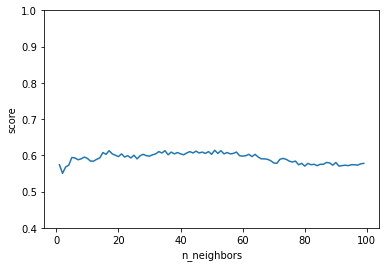

In [313]:
#絵文字なし　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 100): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.4, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [314]:
#kNN
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=51)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[330  63]
 [246 162]]
-----------------------------------------
Accuracy: 0.6142322097378277
-----------------------------------------
F1 score: 0.5118483412322274
-----------------------------------------
Precision: 0.72
-----------------------------------------
Recall: 0.39705882352941174
-----------------------------------------
True Negative Rate: 0.8396946564885496


[1] score: 0.57803
[2] score: 0.55056
[3] score: 0.57553
[4] score: 0.55930
[5] score: 0.59675
[6] score: 0.58302
[7] score: 0.58926
[8] score: 0.59051
[9] score: 0.59426
[10] score: 0.59925
[11] score: 0.60300
[12] score: 0.59176
[13] score: 0.59800
[14] score: 0.59551
[15] score: 0.60674
[16] score: 0.60300
[17] score: 0.60424
[18] score: 0.59551
[19] score: 0.59675
[20] score: 0.59301
[21] score: 0.60050
[22] score: 0.58926
[23] score: 0.59426
[24] score: 0.60050
[25] score: 0.60674
[26] score: 0.59551
[27] score: 0.59551
[28] score: 0.60050
[29] score: 0.59800
[30] score: 0.59426
[31] score: 0.60175
[32] score: 0.59800
[33] score: 0.60549
[34] score: 0.60300
[35] score: 0.60300
[36] score: 0.60050
[37] score: 0.59925
[38] score: 0.59800
[39] score: 0.60424
[40] score: 0.60300
[41] score: 0.60799
[42] score: 0.60424
[43] score: 0.60799
[44] score: 0.60549
[45] score: 0.61423
[46] score: 0.60549
[47] score: 0.60549
[48] score: 0.60050
[49] score: 0.61049
[50] score: 0.59925
[51] scor

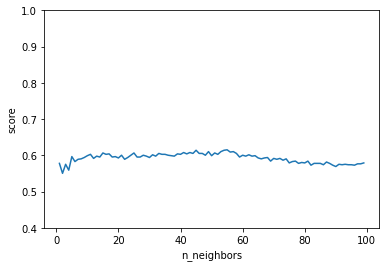

In [318]:
#絵文字あり　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 100): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.4, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [319]:
#絵文字あり#kNN
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=55)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[317  76]
 [232 176]]
-----------------------------------------
Accuracy: 0.6154806491885143
-----------------------------------------
F1 score: 0.5333333333333333
-----------------------------------------
Precision: 0.6984126984126984
-----------------------------------------
Recall: 0.43137254901960786
-----------------------------------------
True Negative Rate: 0.806615776081425


In [94]:
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 1
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.685125
[2]	valid_0's multi_logloss: 0.679296
[3]	valid_0's multi_logloss: 0.673892
[4]	valid_0's multi_logloss: 0.669412
[5]	valid_0's multi_logloss: 0.66562
[6]	valid_0's multi_logloss: 0.662723
[7]	valid_0's multi_logloss: 0.660206
[8]	valid_0's multi_logloss: 0.659038
[9]	valid_0's multi_logloss: 0.658714
[10]	valid_0's multi_logloss: 0.658556
[11]	valid_0's multi_logloss: 0.657597
[12]	valid_0's multi_logloss: 0.65736
[13]	valid_0's multi_logloss: 0.657784
[14]	valid_0's multi_logloss: 0.658051
[15]	valid_0'

In [92]:
#絵文字あり　#勾配ブースティング
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 241
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 1
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.685908
[2]	valid_0's multi_logloss: 0.679203
[3]	valid_0's multi_logloss: 0.673054
[4]	valid_0's multi_logloss: 0.668571
[5]	valid_0's multi_logloss: 0.664536
[6]	valid_0's multi_logloss: 0.661385
[7]	valid_0's multi_logloss: 0.658755
[8]	valid_0's multi_logloss: 0.657079
[9]	valid_0's multi_logloss: 0.656471
[10]	valid_0's multi_logloss: 0.655864
[11]	valid_0's multi_logloss: 0.655966
[12]	valid_0's multi_logloss: 0.655499
[13]	valid_0's multi_logloss: 0.656079
[14]	valid_0's multi_logloss: 0.656226
[15]	valid_

In [168]:
#パターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 1s 9ms/step - loss: 0.6935 - accuracy: 0.5031 - val_loss: 0.6924 - val_accuracy: 0.5289
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6915 - accuracy: 0.5570 - val_loss: 0.6907 - val_accuracy: 0.5413
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6904 - accuracy: 0.5551 - val_loss: 0.6904 - val_accuracy: 0.5367
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6897 - accuracy: 0.5500 - val_loss: 0.6892 - val_accuracy: 0.5554
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6890 - accuracy: 0.5547 - val_loss: 0.6894 - val_accuracy: 0.5554
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6881 - accuracy: 0.5527 - val_loss: 0.6875 - val_accuracy: 0.5507
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.5668 - val_loss: 0.6874 - val_accuracy: 0.5663
Epoch 8/100
2

In [169]:
#パターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[293 100]
 [241 167]]
-----------------------------------------
Accuracy: 0.5742821473158551
-----------------------------------------
F1 score: 0.4948148148148149
-----------------------------------------
Precision: 0.6254681647940075
-----------------------------------------
Recall: 0.40931372549019607
-----------------------------------------
True Negative Rate: 0.7455470737913485


In [173]:
#パターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 8ms/step - loss: 0.6936 - accuracy: 0.5047 - val_loss: 0.6921 - val_accuracy: 0.5507
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6917 - accuracy: 0.5574 - val_loss: 0.6889 - val_accuracy: 0.5398
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6909 - accuracy: 0.5512 - val_loss: 0.6894 - val_accuracy: 0.5554
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6894 - accuracy: 0.5508 - val_loss: 0.6873 - val_accuracy: 0.5554
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6882 - accuracy: 0.5531 - val_loss: 0.6864 - val_accuracy: 0.5523
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.5520 - val_loss: 0.6870 - val_accuracy: 0.5601
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.5582 - val_loss: 0.6846 - val_accuracy: 0.5445
Epoch 8/100
2

In [174]:
#パターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[296  97]
 [251 157]]
-----------------------------------------
Accuracy: 0.5655430711610487
-----------------------------------------
F1 score: 0.47432024169184295
-----------------------------------------
Precision: 0.6181102362204725
-----------------------------------------
Recall: 0.38480392156862747
-----------------------------------------
True Negative Rate: 0.7531806615776081


In [183]:
#絵文字ありパターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6930 - accuracy: 0.5352 - val_loss: 0.6922 - val_accuracy: 0.5460
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6918 - accuracy: 0.5523 - val_loss: 0.6912 - val_accuracy: 0.5491
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6913 - accuracy: 0.5508 - val_loss: 0.6909 - val_accuracy: 0.5523
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6906 - accuracy: 0.5520 - val_loss: 0.6898 - val_accuracy: 0.5616
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6899 - accuracy: 0.5617 - val_loss: 0.6894 - val_accuracy: 0.5616
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6896 - accuracy: 0.5559 - val_loss: 0.6882 - val_accuracy: 0.5616
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6891 - accuracy: 0.5547 - val_loss: 0.6878 - val_accuracy: 0.5632
Epoch 8/100
2

In [184]:
#絵文字あり#パターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[286 107]
 [235 173]]
-----------------------------------------
Accuracy: 0.5730337078651685
-----------------------------------------
F1 score: 0.502906976744186
-----------------------------------------
Precision: 0.6178571428571429
-----------------------------------------
Recall: 0.42401960784313725
-----------------------------------------
True Negative Rate: 0.727735368956743


In [178]:
#絵文字ありパターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6765 - accuracy: 0.5695 - val_loss: 0.6792 - val_accuracy: 0.5585
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.5738 - val_loss: 0.6805 - val_accuracy: 0.5679
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6766 - accuracy: 0.5742 - val_loss: 0.6790 - val_accuracy: 0.5616
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6769 - accuracy: 0.5684 - val_loss: 0.6820 - val_accuracy: 0.5523
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.5746 - val_loss: 0.6768 - val_accuracy: 0.5679
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.5738 - val_loss: 0.6782 - val_accuracy: 0.5725
Epoch 7/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6762 - accuracy: 0.5738 - val_loss: 0.6782 - val_accuracy: 0.5632
Epoch 8/100
2

In [179]:
#絵文字あり#パターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[298  95]
 [245 163]]
-----------------------------------------
Accuracy: 0.5755305867665418
-----------------------------------------
F1 score: 0.4894894894894895
-----------------------------------------
Precision: 0.6317829457364341
-----------------------------------------
Recall: 0.39950980392156865
-----------------------------------------
True Negative Rate: 0.7582697201017812


### VADERで教師あり学習

In [48]:
#VADERのcompoundで判定する
df_preprocessed_compound=pd.DataFrame(preprocessed_compound)

In [329]:
#絵文字あり#VADERのcompoundで判定する
emoji_df_preprocessed_compound=pd.DataFrame(emoji_preprocessed_compound)

In [49]:
df_preprocessed_compound_list = [[] for i in range(4002)]

for i in range(4002):
  df_preprocessed_compound_list[i].append(df_preprocessed_compound.iloc[i,0])

df_preprocessed_compound_list_Dataframe=pd.DataFrame(df_preprocessed_compound_list)
print(df_preprocessed_compound_list_Dataframe)

           0
0     0.0000
1     0.1027
2     0.4019
3     0.0000
4     0.7184
...      ...
3997  0.4404
3998  0.0000
3999  0.0000
4000 -0.5106
4001 -0.4404

[4002 rows x 1 columns]


In [330]:
#絵文字あり
emoji_df_preprocessed_compound_list = [[] for i in range(4002)]

for i in range(4002):
  emoji_df_preprocessed_compound_list[i].append(emoji_df_preprocessed_compound.iloc[i,0])

emoji_df_preprocessed_compound_list_Dataframe=pd.DataFrame(emoji_df_preprocessed_compound_list)

for i in range(4002):
  emoji_df_preprocessed_compound_list[i].append(emoji_df_preprocessed_compound.iloc[i,0])

emoji_df_preprocessed_compound_list_Dataframe=pd.DataFrame(emoji_df_preprocessed_compound_list)

In [50]:
X=df_preprocessed_compound_list_Dataframe.values
y=df_preprocessed_compound.iloc[:,1].values

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [337]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 1
X_testの行数: 3201
X_testの行数: 1


In [51]:
print(X_train)

[[-0.1779]
 [ 0.3818]
 [ 0.836 ]
 ...
 [ 0.0772]
 [ 0.    ]
 [ 0.2023]]


In [52]:
print(y_train)

[0 1 1 ... 1 0 0]


In [334]:
#絵文字あり
X=emoji_df_preprocessed_compound_list_Dataframe.values
y=emoji_df_preprocessed_compound.iloc[:,1].values

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [335]:
print("X_trainの行数:",(X_train.shape[0]))
print("X_trainの行数:",(X_train.shape[1]))
print("X_testの行数:",(X_train.shape[0]))
print("X_testの行数:",(X_train.shape[1]))

X_trainの行数: 3201
X_trainの行数: 2
X_testの行数: 3201
X_testの行数: 2


In [98]:
print(df_preprocessed_compound)

           0  1
0     0.0000  1
1     0.1027  1
2     0.4019  1
3     0.0000  1
4     0.7184  1
...      ... ..
3997  0.4404  0
3998  0.0000  0
3999  0.0000  0
4000 -0.5106  0
4001 -0.4404  0

[4002 rows x 2 columns]


In [239]:
#パラメーターチューニング#絵文字なし
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(10000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  5000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  4335
通常のランダムフォレストモデルによる予測値         :  -0.519
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.529
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.529


In [240]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =4335,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)

from sklearn.metrics import accuracy_score
print('Accuracy:',accuracy_score(y_test,y_pred))

from sklearn.metrics import f1_score
print('F1 score:', f1_score(y_test,y_pred))

from sklearn.metrics import precision_score
print('Precision:', precision_score(y_test,y_pred))

from sklearn.metrics import recall_score
print('Recall:', recall_score(y_test,y_pred))

TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[197 196]
 [110 298]]
Accuracy: 0.6179775280898876
F1 score: 0.6607538802660753
Precision: 0.6032388663967612
Recall: 0.7303921568627451
-----------------------------------------
True Negative Rate: 0.5012722646310432


In [244]:
#パラメーターチューニング#絵文字あり
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# グリッドサーチ(パラメータ候補指定)用のパラメータ10種
#paramG = {'n_estimators':[1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
paramG = {'n_estimators':[1000, 2000, 3000, 4000, 5000, 6000]}
# ランダムサーチ(パラメータ範囲指定)用のパラメータ 1~100
paramR = {'n_estimators':np.arange(6000)}

# モデル生成。上から順に、通常のランダムフォレスト、グリッドサーチ・ランダムフォレスト、
# ランダムサーチ・ランダムフォレスト。
RFC_raw  = RandomForestClassifier(random_state=0)
RFC_grid = GridSearchCV(estimator=RandomForestClassifier(random_state=0), param_grid=paramG, \
                        scoring='r2', cv=3)
RFC_rand = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=0), param_distributions=paramR, \
                        scoring='r2', cv=3)

# 各モデルに学習を行わせる。
RFC_raw.fit (X_train,y_train)
RFC_grid.fit(X_train,y_train)
RFC_rand.fit(X_train,y_train)

# 各モデルの n_estimators パラメータの確認。
print('通常のランダムフォレストモデルにおける n_estimators         :  %d'  %RFC_raw.n_estimators)
print('グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  %d'  %RFC_grid.best_estimator_.n_estimators)
print('ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  %d'  %RFC_rand.best_estimator_.n_estimators)


# 各モデルにより算出される予測値
print('通常のランダムフォレストモデルによる予測値         :  %.3f'  %r2_score(y_test, RFC_raw.predict(X_test)))
print('グリッドサーチ・ランダムフォレストモデルによる予測値   :  %.3f'  %r2_score(y_test, RFC_grid.predict(X_test)))
print('ランダムサーチ・ランダムフォレストモデルによる予測値  :  %.3f'  %r2_score(y_test, RFC_rand.predict(X_test)))


通常のランダムフォレストモデルにおける n_estimators         :  100
グリッドサーチ・ランダムフォレストモデルにおける n_estimators   :  5000
ランダムサーチ・ランダムフォレストモデルにおける n_estimators  :  4859
通常のランダムフォレストモデルによる予測値         :  -0.524
グリッドサーチ・ランダムフォレストモデルによる予測値   :  -0.529
ランダムサーチ・ランダムフォレストモデルによる予測値  :  -0.529


In [245]:
#絵文字あり#RandomForest
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier(n_estimators =4859,criterion="entropy",random_state =0)
classifier.fit(X_train,y_train)
#Predicting the Test set results
y_pred = classifier.predict(X_test) 

from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)

from sklearn.metrics import accuracy_score
print('Accuracy:',accuracy_score(y_test,y_pred))

from sklearn.metrics import f1_score
print('F1 score:', f1_score(y_test,y_pred))

from sklearn.metrics import precision_score
print('Precision:', precision_score(y_test,y_pred))

from sklearn.metrics import recall_score
print('Recall:', recall_score(y_test,y_pred))

TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[197 196]
 [110 298]]
Accuracy: 0.6179775280898876
F1 score: 0.6607538802660753
Precision: 0.6032388663967612
Recall: 0.7303921568627451
-----------------------------------------
True Negative Rate: 0.5012722646310432


In [353]:
#SVC
from sklearn.svm import SVC

#model = SVC(gamma='auto')
model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[122 271]
 [ 85 323]]
-----------------------------------------
Accuracy: 0.5555555555555556
-----------------------------------------
F1 score: 0.6447105788423154
-----------------------------------------
Precision: 0.5437710437710438
-----------------------------------------
Recall: 0.7916666666666666
-----------------------------------------
True Negative Rate: 0.3104325699745547


In [282]:
#絵文字なしLinearSVC
from sklearn.svm import SVC

model = LinearSVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[248 145]
 [215 193]]
-----------------------------------------
Accuracy: 0.550561797752809
-----------------------------------------
F1 score: 0.517426273458445
-----------------------------------------
Precision: 0.5710059171597633
-----------------------------------------
Recall: 0.4730392156862745
-----------------------------------------
True Negative Rate: 0.6310432569974554


In [283]:
#絵文字なしOnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[122 271]
 [ 85 323]]
-----------------------------------------
Accuracy: 0.5555555555555556
-----------------------------------------
F1 score: 0.6447105788423154
-----------------------------------------
Precision: 0.5437710437710438
-----------------------------------------
Recall: 0.7916666666666666
-----------------------------------------
True Negative Rate: 0.3104325699745547


In [123]:
#絵文字あり#SVC
from sklearn.svm import SVC

model = SVC(gamma='auto')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[127 266]
 [ 89 319]]
-----------------------------------------
Accuracy: 0.5568039950062422
-----------------------------------------
F1 score: 0.6424974823766364
-----------------------------------------
Precision: 0.5452991452991452
-----------------------------------------
Recall: 0.7818627450980392
-----------------------------------------
True Negative Rate: 0.3231552162849873


In [287]:
#絵文字ありLinearSVC
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[122 271]
 [ 85 323]]
-----------------------------------------
Accuracy: 0.5555555555555556
-----------------------------------------
F1 score: 0.6447105788423154
-----------------------------------------
Precision: 0.5437710437710438
-----------------------------------------
Recall: 0.7916666666666666
-----------------------------------------
True Negative Rate: 0.3104325699745547


In [288]:
#絵文字ありOnevsOneClassifier
from sklearn.svm import SVC

model = OneVsOneClassifier(SVC())
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[122 271]
 [ 85 323]]
-----------------------------------------
Accuracy: 0.5555555555555556
-----------------------------------------
F1 score: 0.6447105788423154
-----------------------------------------
Precision: 0.5437710437710438
-----------------------------------------
Recall: 0.7916666666666666
-----------------------------------------
True Negative Rate: 0.3104325699745547


In [101]:
#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[248 145]
 [215 193]]
-----------------------------------------
Accuracy: 0.550561797752809
-----------------------------------------
F1 score: 0.517426273458445
-----------------------------------------
Precision: 0.5710059171597633
-----------------------------------------
Recall: 0.4730392156862745
-----------------------------------------
True Negative Rate: 0.6310432569974554


In [118]:
#絵文字あり#ロジスティック回帰
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[248 145]
 [215 193]]
-----------------------------------------
Accuracy: 0.550561797752809
-----------------------------------------
F1 score: 0.517426273458445
-----------------------------------------
Precision: 0.5710059171597633
-----------------------------------------
Recall: 0.4730392156862745
-----------------------------------------
True Negative Rate: 0.6310432569974554


[1] score: 0.521847690387016
[2] score: 0.528089887640449
[3] score: 0.544319600499376
[4] score: 0.536828963795256
[5] score: 0.573033707865168
[6] score: 0.548064918851436
[7] score: 0.570536828963795
[8] score: 0.570536828963795
[9] score: 0.584269662921348
[10] score: 0.574282147315855
[11] score: 0.586766541822722
[12] score: 0.580524344569288
[13] score: 0.599250936329588
[14] score: 0.593008739076155
[15] score: 0.606741573033708
[16] score: 0.598002496878901
[17] score: 0.602996254681648
[18] score: 0.590511860174782
[19] score: 0.591760299625468
[20] score: 0.589263420724095
[21] score: 0.590511860174782
[22] score: 0.589263420724095
[23] score: 0.594257178526841
[24] score: 0.586766541822722
[25] score: 0.588014981273408
[26] score: 0.593008739076155
[27] score: 0.590511860174782
[28] score: 0.590511860174782
[29] score: 0.590511860174782
[30] score: 0.604244694132335
[31] score: 0.606741573033708
[32] score: 0.611735330836454
[33] score: 0.615480649188514
[34] score: 0.60174

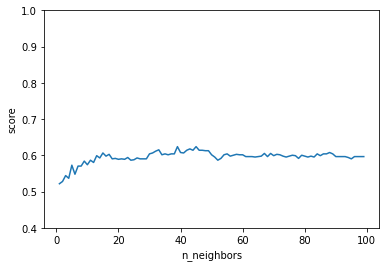

In [326]:
#絵文字なし　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 100): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.15f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.4, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [327]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=39)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[299  94]
 [207 201]]
-----------------------------------------
Accuracy: 0.6242197253433208
-----------------------------------------
F1 score: 0.5718349928876244
-----------------------------------------
Precision: 0.6813559322033899
-----------------------------------------
Recall: 0.49264705882352944
-----------------------------------------
True Negative Rate: 0.7608142493638677


In [328]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=45)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[297  96]
 [205 203]]
-----------------------------------------
Accuracy: 0.6242197253433208
-----------------------------------------
F1 score: 0.5742574257425743
-----------------------------------------
Precision: 0.6789297658862876
-----------------------------------------
Recall: 0.49754901960784315
-----------------------------------------
True Negative Rate: 0.7557251908396947


[1] score: 0.50562
[2] score: 0.54307
[3] score: 0.55930
[4] score: 0.58052
[5] score: 0.58801
[6] score: 0.56429
[7] score: 0.56554
[8] score: 0.56055
[9] score: 0.56305
[10] score: 0.56305
[11] score: 0.57553
[12] score: 0.57928
[13] score: 0.58552
[14] score: 0.61049
[15] score: 0.61923
[16] score: 0.63421
[17] score: 0.61049
[18] score: 0.61049
[19] score: 0.60674
[20] score: 0.60300
[21] score: 0.60549
[22] score: 0.61548
[23] score: 0.60175
[24] score: 0.60549
[25] score: 0.59675
[26] score: 0.61049
[27] score: 0.58552
[28] score: 0.59675
[29] score: 0.59675
[30] score: 0.59301
[31] score: 0.60300
[32] score: 0.61423
[33] score: 0.61298
[34] score: 0.61798
[35] score: 0.61423
[36] score: 0.61049
[37] score: 0.61049
[38] score: 0.60424
[39] score: 0.61798
[40] score: 0.60424
[41] score: 0.61548
[42] score: 0.60424
[43] score: 0.60674
[44] score: 0.60674
[45] score: 0.61423
[46] score: 0.61174
[47] score: 0.61298
[48] score: 0.60424
[49] score: 0.60799
[50] score: 0.61548
[51] scor

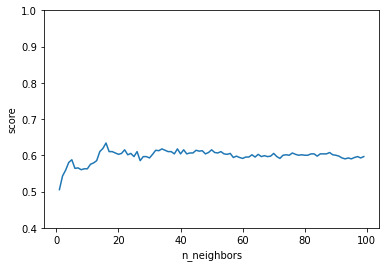

In [332]:
#絵文字あり　knnパラメータチューニング
from sklearn.neighbors import KNeighborsClassifier

list_nn = []
list_score = []
for k in range(1, 100): # K = 1~1000
  # KNeighborsClassifier
  knc = KNeighborsClassifier(n_neighbors=k)
  knc.fit(X_train, y_train)

  # 予測　
  Y_pred = knc.predict(X_test)

  # 評価 R^2
  score = knc.score(X_test, y_test)
  print("[%d] score: {:.5f}".format(score) % k)

  list_nn.append(k)
  list_score.append(score)

# プロット
plt.ylim(0.4, 1.0)
plt.xlabel("n_neighbors")
plt.ylabel("score")
plt.plot(list_nn, list_score)

In [333]:
#絵文字あり
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=16)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[320  73]
 [220 188]]
-----------------------------------------
Accuracy: 0.634207240948814
-----------------------------------------
F1 score: 0.56203288490284
-----------------------------------------
Precision: 0.7203065134099617
-----------------------------------------
Recall: 0.46078431372549017
-----------------------------------------
True Negative Rate: 0.8142493638676844


In [103]:
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 192
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 1
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.681733
[2]	valid_0's multi_logloss: 0.672982
[3]	valid_0's multi_logloss: 0.666185
[4]	valid_0's multi_logloss: 0.661216
[5]	valid_0's multi_logloss: 0.656436
[6]	valid_0's multi_logloss: 0.653302
[7]	valid_0's multi_logloss: 0.650487
[8]	valid_0's multi_logloss: 0.647809
[9]	valid_0's multi_logloss: 0.645976
[10]	valid_0's multi_logloss: 0.644336
[11]	valid_0's multi_logloss: 0.643003
[12]	valid_0's multi_logloss: 0.641704
[13]	valid_0's multi_logloss: 0.64052
[14]	valid_0's multi_logloss: 0.639613
[15]	valid_0

In [120]:
#絵文字あり勾配ブースティング
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import numpy as np

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)

params = {
    'objective': 'multiclass',
    'num_class': 3,
}
num_round = 100

model = lgb.train(
    params,
    lgb_train,
    valid_sets=lgb_eval,
    num_boost_round=num_round,
)

pred = model.predict(X_test)
y_pred = []
for p in pred:
    y_pred.append(np.argmax(p))

matrix = confusion_matrix(y_test, y_pred)

print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 3201, number of used features: 2
[LightGBM] [Info] Start training from score -0.688472
[LightGBM] [Info] Start training from score -0.697844
[LightGBM] [Info] Start training from score -34.538776
[1]	valid_0's multi_logloss: 0.681659
[2]	valid_0's multi_logloss: 0.672791
[3]	valid_0's multi_logloss: 0.665872
[4]	valid_0's multi_logloss: 0.66037
[5]	valid_0's multi_logloss: 0.656179
[6]	valid_0's multi_logloss: 0.652666
[7]	valid_0's multi_logloss: 0.649416
[8]	valid_0's multi_logloss: 0.647345
[9]	valid_0's multi_logloss: 0.645337
[10]	valid_0's multi_logloss: 0.643427
[11]	valid_0's multi_logloss: 0.642144
[12]	valid_0's multi_logloss: 0.640836
[13]	valid_0's multi_logloss: 0.639993
[14]	valid_0's multi_logloss: 0.63896
[15]	valid_0'

In [198]:
#パターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6841 - accuracy: 0.5402 - val_loss: 0.6908 - val_accuracy: 0.5070
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6787 - accuracy: 0.5641 - val_loss: 0.6923 - val_accuracy: 0.5070
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.5602 - val_loss: 0.6902 - val_accuracy: 0.5070
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6779 - accuracy: 0.5609 - val_loss: 0.6900 - val_accuracy: 0.5070
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.5641 - val_loss: 0.6894 - val_accuracy: 0.5351
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6783 - accuracy: 0.5676 - val_loss: 0.6889 - val_accuracy: 0.5398
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.5637 - val_loss: 0.6896 - val_accuracy: 0.5351
Epoch 8/100
2

In [199]:
#パターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[165 228]
 [123 285]]
-----------------------------------------
Accuracy: 0.5617977528089888
-----------------------------------------
F1 score: 0.6188925081433225
-----------------------------------------
Precision: 0.5555555555555556
-----------------------------------------
Recall: 0.6985294117647058
-----------------------------------------
True Negative Rate: 0.4198473282442748


In [203]:
#パターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6808 - accuracy: 0.5594 - val_loss: 0.6905 - val_accuracy: 0.5101
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6786 - accuracy: 0.5598 - val_loss: 0.6906 - val_accuracy: 0.5351
Epoch 3/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6784 - accuracy: 0.5691 - val_loss: 0.6892 - val_accuracy: 0.5398
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.5598 - val_loss: 0.6893 - val_accuracy: 0.5398
Epoch 5/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6778 - accuracy: 0.5699 - val_loss: 0.6892 - val_accuracy: 0.5398
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6775 - accuracy: 0.5656 - val_loss: 0.6880 - val_accuracy: 0.5382
Epoch 7/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6776 - accuracy: 0.5684 - val_loss: 0.6878 - val_accuracy: 0.5382
Epoch 8/100
2

In [204]:
#パターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[200 193]
 [153 255]]
-----------------------------------------
Accuracy: 0.568039950062422
-----------------------------------------
F1 score: 0.5957943925233645
-----------------------------------------
Precision: 0.5691964285714286
-----------------------------------------
Recall: 0.625
-----------------------------------------
True Negative Rate: 0.5089058524173028


In [215]:
#絵文字あり#パターン1
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6803 - accuracy: 0.5543 - val_loss: 0.6905 - val_accuracy: 0.5070
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.5633 - val_loss: 0.6908 - val_accuracy: 0.5070
Epoch 3/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.5660 - val_loss: 0.6909 - val_accuracy: 0.5398
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.5547 - val_loss: 0.6887 - val_accuracy: 0.5070
Epoch 5/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.5590 - val_loss: 0.6900 - val_accuracy: 0.5382
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6777 - accuracy: 0.5660 - val_loss: 0.6882 - val_accuracy: 0.5398
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.5668 - val_loss: 0.6877 - val_accuracy: 0.5398
Epoch 8/100
2

In [216]:
#絵文字あり#パターン1
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[157 236]
 [108 300]]
-----------------------------------------
Accuracy: 0.5705368289637952
-----------------------------------------
F1 score: 0.635593220338983
-----------------------------------------
Precision: 0.5597014925373134
-----------------------------------------
Recall: 0.7352941176470589
-----------------------------------------
True Negative Rate: 0.3994910941475827


In [210]:
#絵文字あり#パターン2
# 定数（ミニバッチ学習時に必要となるもの）
BATCH_SIZE = 96   # バッチサイズ： 96
EPOCHS = 100      # エポック数： 100

# 学習する
hist = model.fit(x=X_train,                          # 訓練用データ
                 y=y_train,                          # 訓練用ラベル
                 validation_split=0.2,               # 精度検証用の割合：20％
                 batch_size=BATCH_SIZE,              # バッチサイズ
                 epochs=EPOCHS,                      # エポック数
                 verbose=1,                          # 実行状況表示
                 callbacks=[])                       # コールバック（早期終了しない場合）
                 #callbacks=[es])                    # コールバック（早期終了する場合）

Epoch 1/100
27/27 [==============================] - 0s 9ms/step - loss: 0.6798 - accuracy: 0.5625 - val_loss: 0.6900 - val_accuracy: 0.5117
Epoch 2/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6777 - accuracy: 0.5688 - val_loss: 0.6893 - val_accuracy: 0.5398
Epoch 3/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6782 - accuracy: 0.5508 - val_loss: 0.6861 - val_accuracy: 0.5382
Epoch 4/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6786 - accuracy: 0.5676 - val_loss: 0.6879 - val_accuracy: 0.5382
Epoch 5/100
27/27 [==============================] - 0s 6ms/step - loss: 0.6784 - accuracy: 0.5672 - val_loss: 0.6888 - val_accuracy: 0.5398
Epoch 6/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6783 - accuracy: 0.5676 - val_loss: 0.6875 - val_accuracy: 0.5382
Epoch 7/100
27/27 [==============================] - 0s 5ms/step - loss: 0.6776 - accuracy: 0.5680 - val_loss: 0.6884 - val_accuracy: 0.5398
Epoch 8/100
2

In [211]:
#絵文字あり#パターン2
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1)

matrix = confusion_matrix(y_test, y_pred)
print(matrix)
print('-----------------------------------------')
print('Accuracy:',accuracy_score(y_test,y_pred))
print('-----------------------------------------')
print('F1 score:', f1_score(y_test,y_pred))
print('-----------------------------------------')
print('Precision:', precision_score(y_test,y_pred))
print('-----------------------------------------')
print('Recall:', recall_score(y_test,y_pred))
TN = matrix[0][0]
FP = matrix[0][1]
TNR = float(TN)/float((FP+TN))
print('-----------------------------------------')
print('True Negative Rate:',TNR)

[[195 198]
 [148 260]]
-----------------------------------------
Accuracy: 0.568039950062422
-----------------------------------------
F1 score: 0.6004618937644342
-----------------------------------------
Precision: 0.5676855895196506
-----------------------------------------
Recall: 0.6372549019607843
-----------------------------------------
True Negative Rate: 0.4961832061068702
